#Marqueurs "mean"

In [ ]:
df_mean = df_CS[['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']]

In [ ]:
display(df_mean.head())

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


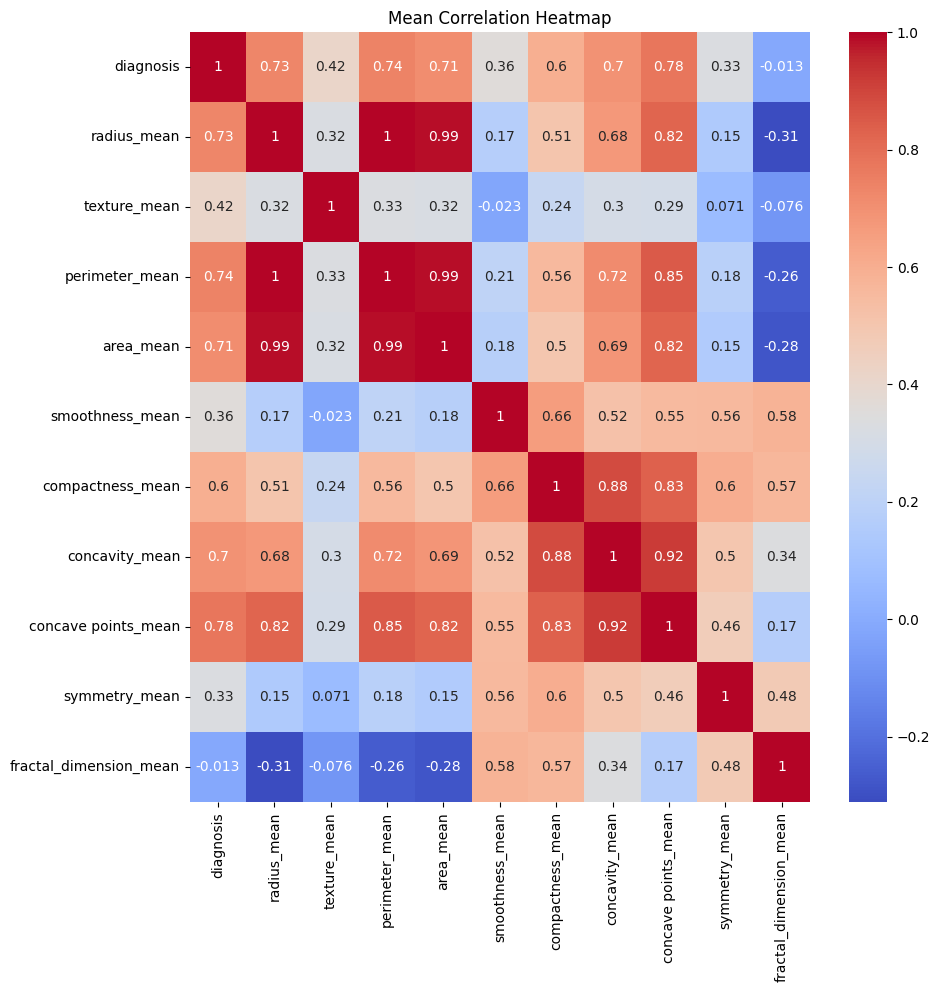

In [ ]:
correlation_matrix = df_mean.corr()

plt.figure(figsize = (10,10))

sns.heatmap(correlation_matrix, cmap="coolwarm", annot = True)

plt.title("Mean Correlation Heatmap")

plt.show()

On constate de fortes corrélations positives (> 0.60)

Radius_mean, perimeter_mean, area_mean, compactness_mean, concavity_mean, concave points_mean sont les marqueurs les plus positivement reliès au diagnostic



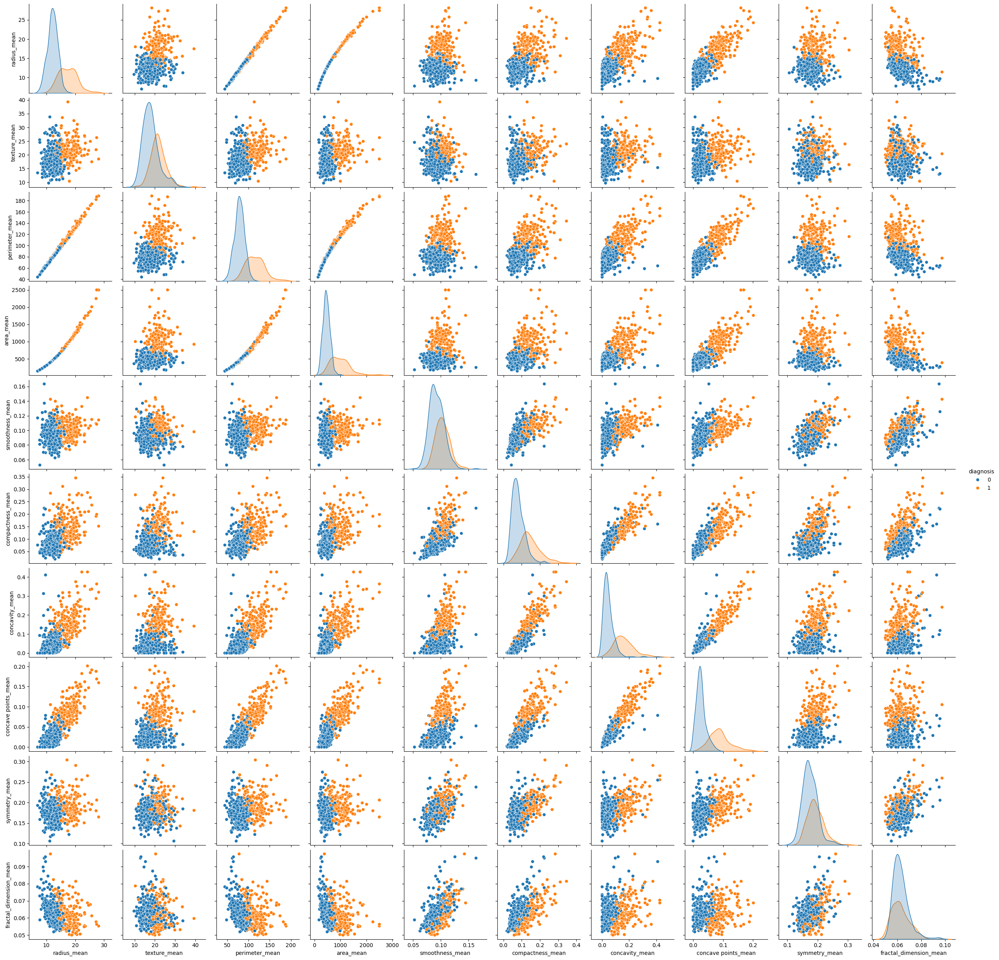

In [ ]:
# on veut observer avec un pairplot

sns.pairplot(df_mean, hue="diagnosis")
plt.show()

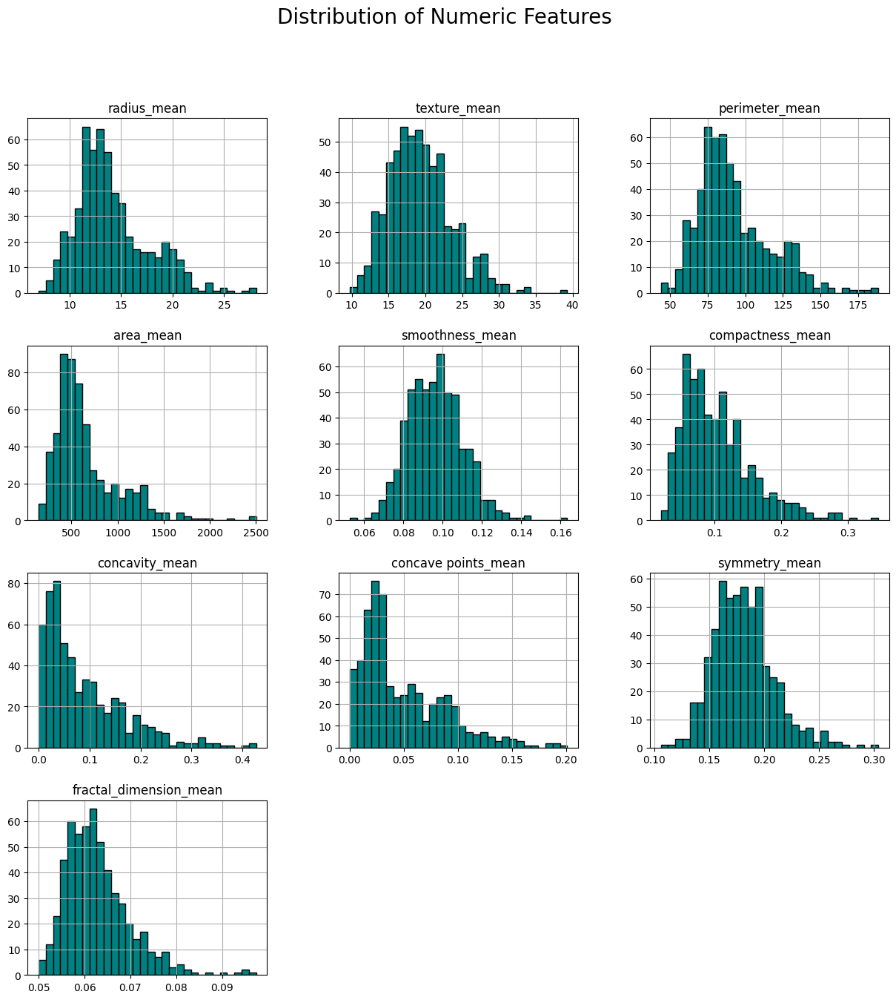

In [ ]:
# Examine the distributions of mean features
sans_col = ["diagnosis"]
df_mean_sans = df_mean.loc[:, ~df_mean.columns.isin(sans_col)]

df_mean_sans.hist(bins=30, figsize=(15, 15), color='teal', edgecolor='black')
plt.suptitle('Distribution of Numeric Features', fontsize=20)
plt.show()

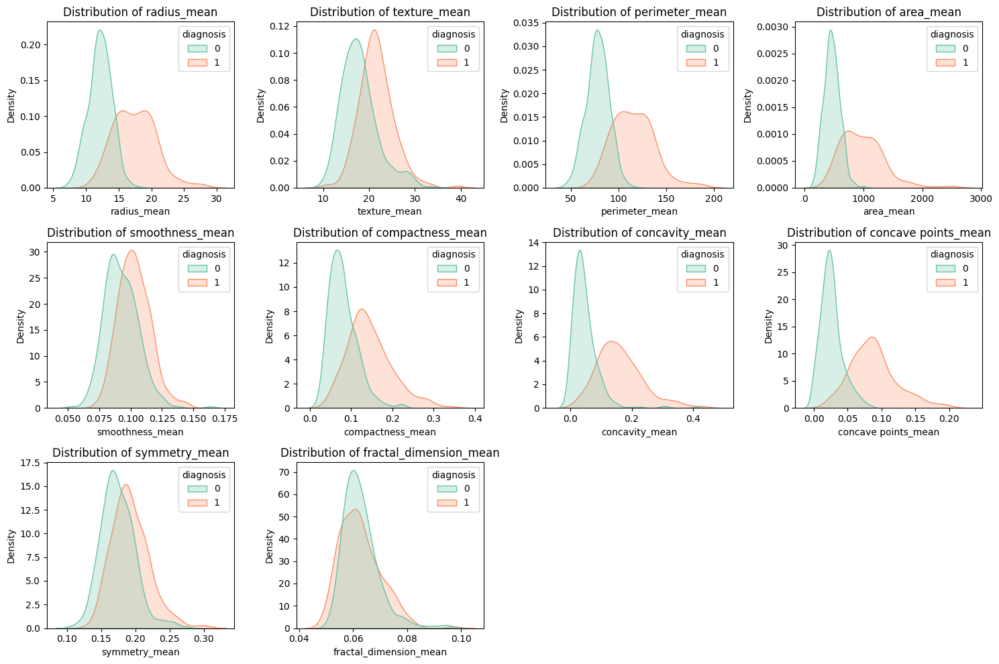

In [ ]:
# Comparing feature distributions between malignant and benign diagnoses
plt.figure(figsize=(15, 10))
for i, column in enumerate(df_CS.columns[1:11], 1):
    plt.subplot(3, 4, i)
    sns.kdeplot(data=df_CS, x=column, hue='diagnosis', fill=True, common_norm=False, palette='Set2')
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

In [ ]:
display(df_mean.head())

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


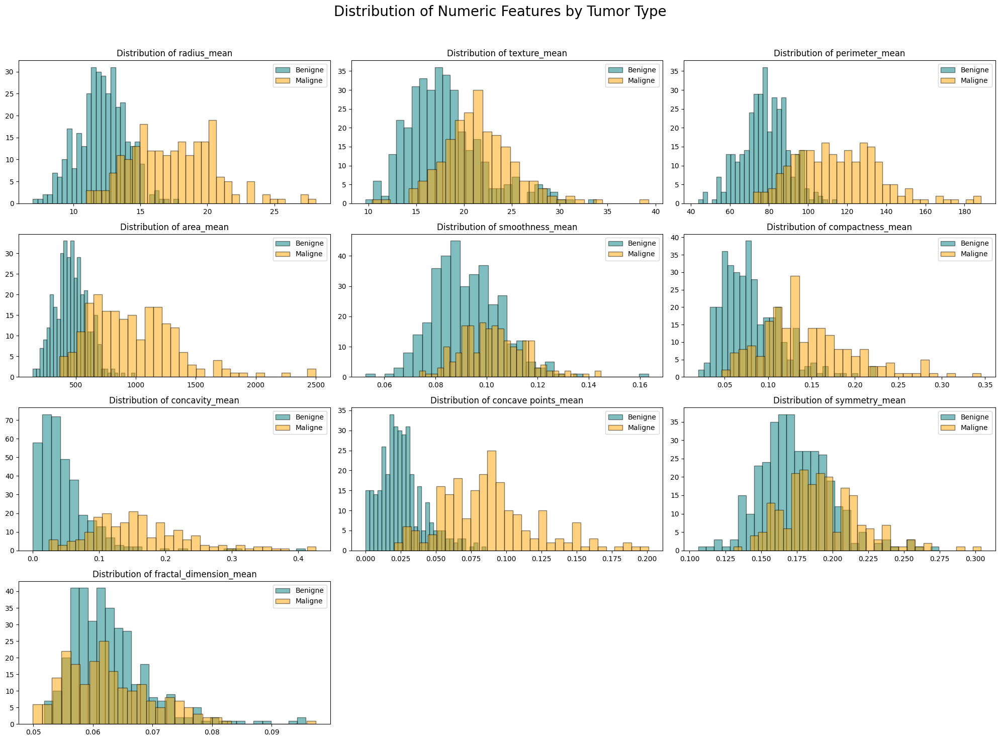

In [ ]:
# Filtrer les données par type de tumeur
benign = df_mean[df_mean['diagnosis'] == 0]
malignant = df_mean[df_mean['diagnosis'] == 1]

# Pour chaque colonne numérique dans df_mean
sans_col = ["diagnosis"]
df_mean_sans = df_mean.loc[:, ~df_mean.columns.isin(sans_col)]
numeric_columns = df_mean_sans.select_dtypes(include='number').columns

# Créer des histogrammes empilés
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns) // 3 + 1, 3, i)
    plt.hist(benign[column], bins=30, alpha=0.5, label='Benigne', color='teal', edgecolor='black')
    plt.hist(malignant[column], bins=30, alpha=0.5, label='Maligne', color='orange', edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.legend()

plt.suptitle('Distribution of Numeric Features by Tumor Type', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Ce que nous avions obervé pour les corrélations se vérifie dans les distributions des variables selon le diagnostic: les variables texture_mean, smoothness_mean, symmetry_mean, fractal_dimension_mean

<ipython-input-56-0284e4e55259>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean[numeric_columns] = scaler.fit_transform(df_mean[numeric_columns])
<ipython-input-56-0284e4e55259>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


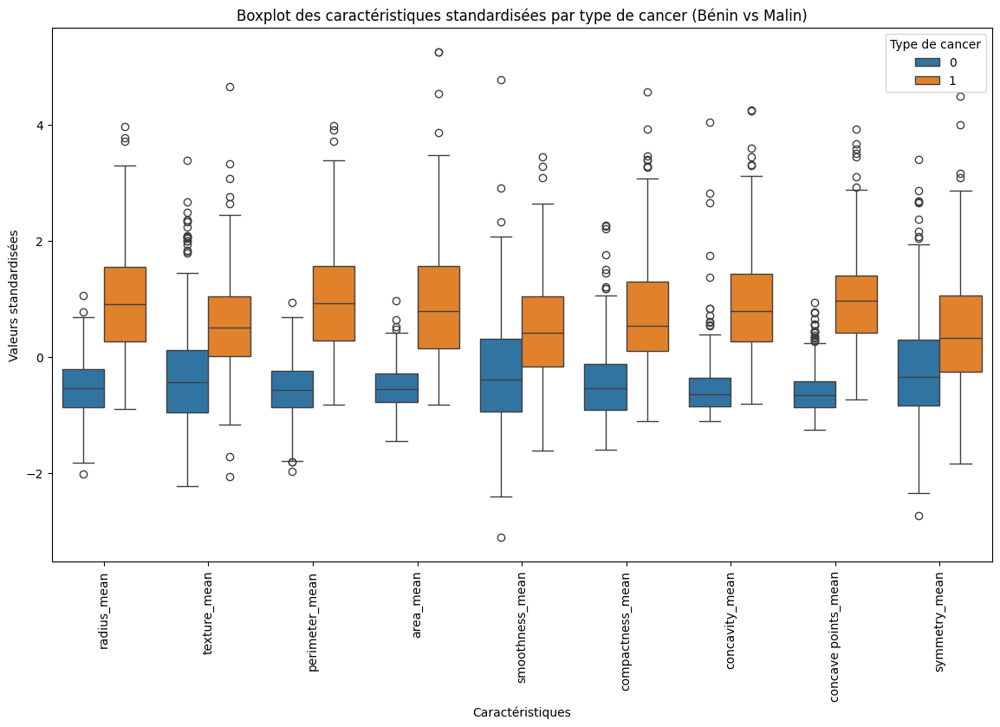

In [ ]:
from sklearn.preprocessing import StandardScaler

numeric_columns = df_mean.columns[1:-1]


# Standardisation des données
scaler = StandardScaler()
df_mean[numeric_columns] = scaler.fit_transform(df_mean[numeric_columns])

df_mean['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_mean.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()


<ipython-input-57-b6b0cd73fe8d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean[numeric_columns] = scaler.fit_transform(df_mean[numeric_columns])
<ipython-input-57-b6b0cd73fe8d>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mean['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


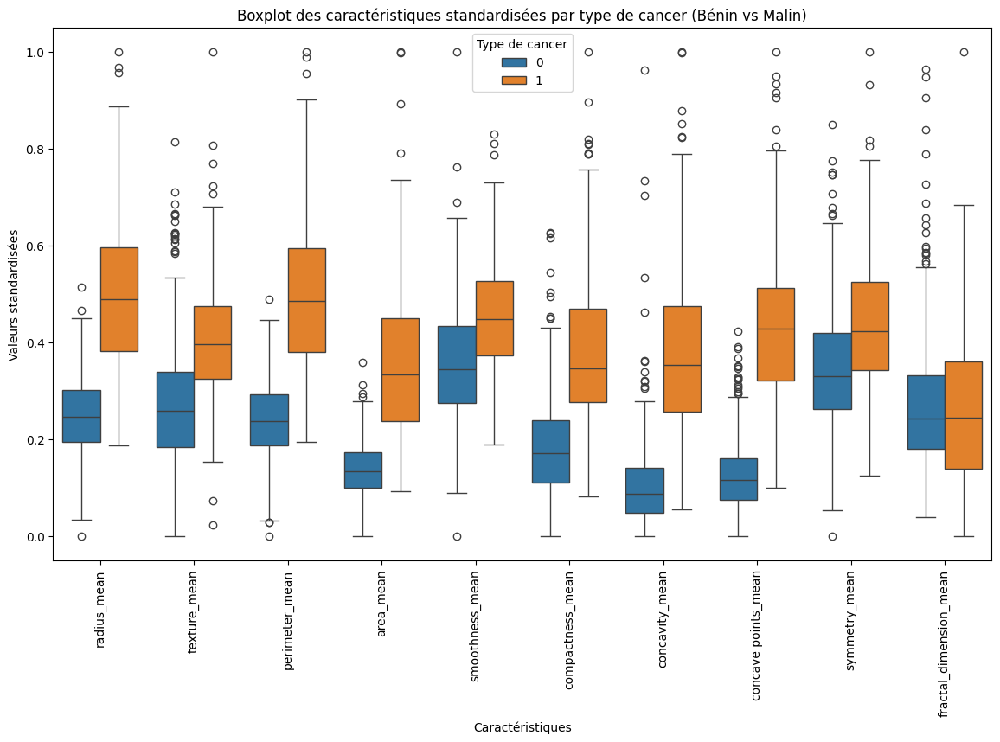

In [ ]:
from sklearn.preprocessing import MinMaxScaler

numeric_columns = df_mean.columns[1:-1]


# Standardisation des données
scaler = MinMaxScaler()
df_mean[numeric_columns] = scaler.fit_transform(df_mean[numeric_columns])

df_mean['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_mean.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

On trouve dans les boxplots les mêmes schémas que pour les graphes de distribution, à savoir pour certains marqueurs la difficulté à trouver une séparation claire entre les cas bénins des cas malins (smoothness_mean, symmetry_mean, fractal_dimension_mean)

#Erreurs standards

In [ ]:
df_SE = df_CS[['diagnosis', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']]

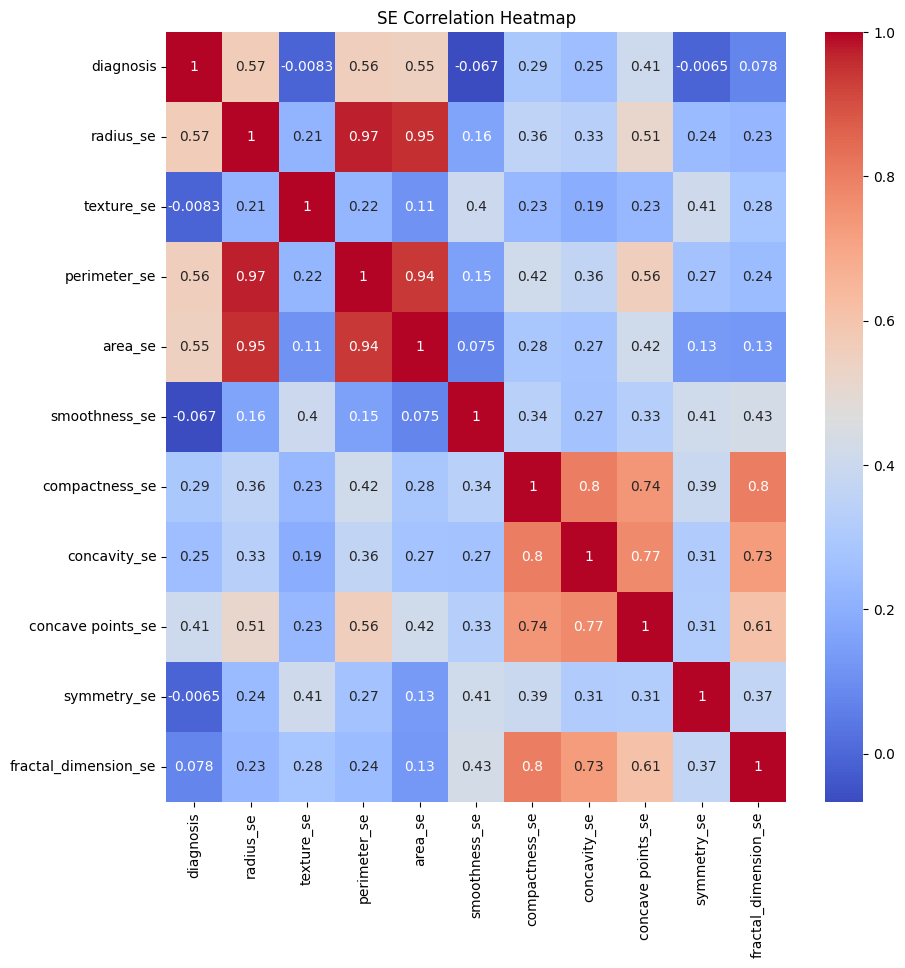

In [ ]:
correlation_matrix = df_SE.corr()

plt.figure(figsize = (10,10))

sns.heatmap(correlation_matrix, cmap="coolwarm", annot = True)

plt.title("SE Correlation Heatmap")

plt.show()

Les marqueurs d'erreur standard sont très peu corrélés au diagnostic mais relativement corrélés entre eux, notamment radius-perimeter-area et compactness-concavity-concave points

Les variables radius-perimeter-area sont calculéés les unes par rapport aux autres, elles sont donc redondantes et nousseront amenés à n'en conserver qu'une seule

Les variables compactness-concavity-concave points sont très corrélées entre elles mais ne sont pas calculées les unes par rapport aux autres.

En revanche on constate que compactness est calculée en utilsant le périmètre et l'aire, et c'est donc un indicateur des variables que nous pouvons écarter (perimeter et area)

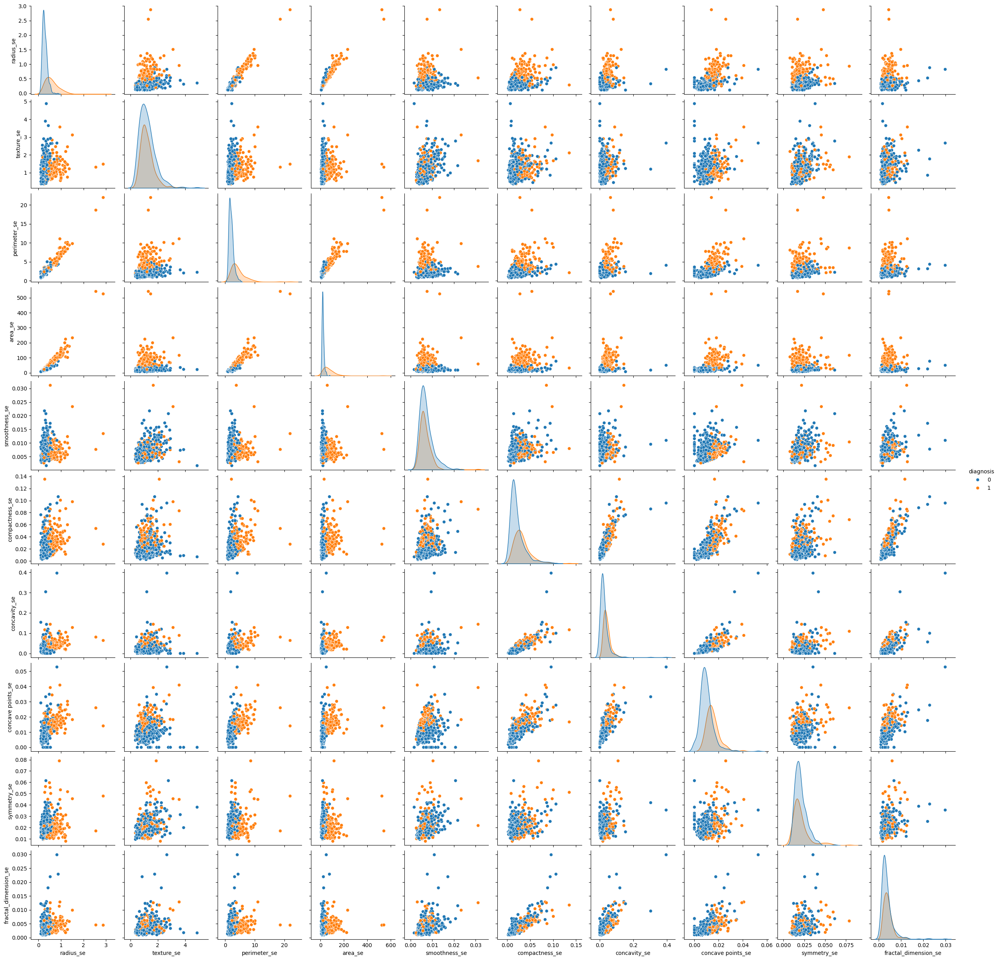

In [ ]:
sns.pairplot(df_SE, hue="diagnosis")
plt.show()

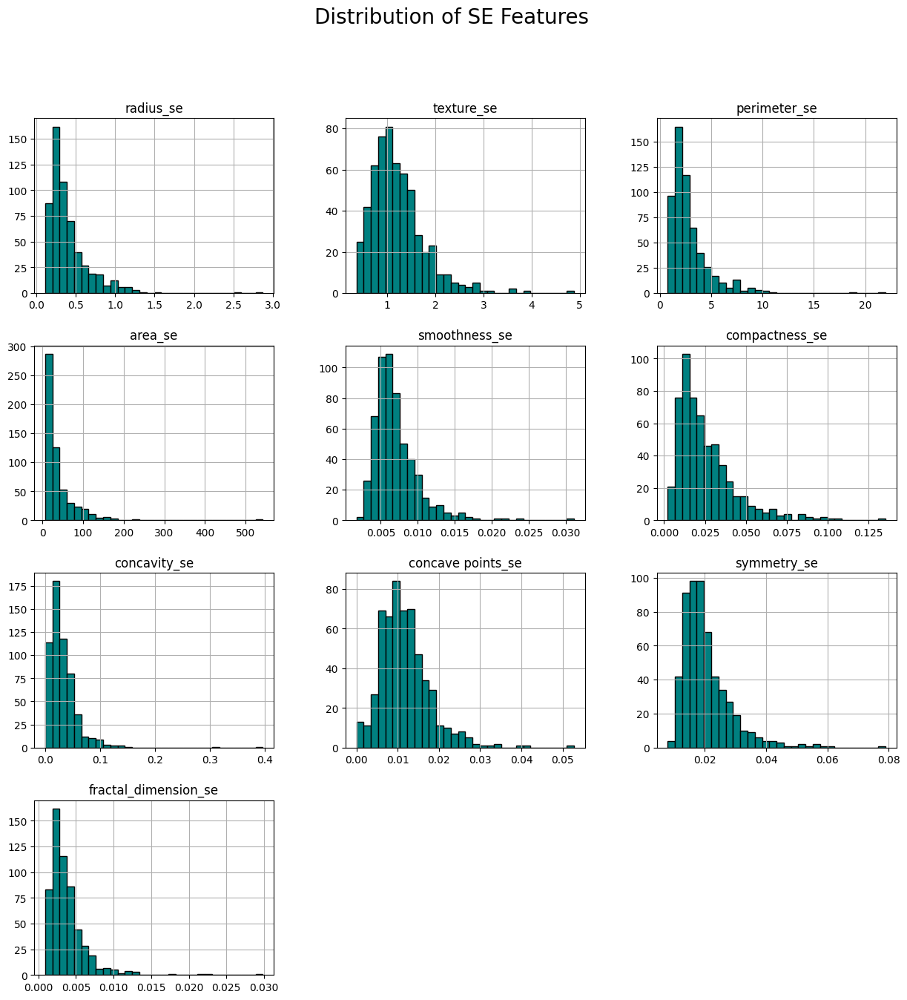

In [ ]:
# Examine the distributions of SE features
sans_col = ["diagnosis"]
df_SE_sans = df_SE.loc[:, ~df_SE.columns.isin(sans_col)]

df_SE_sans.hist(bins=30, figsize=(15, 15), color='teal', edgecolor='black')
plt.suptitle('Distribution of SE Features', fontsize=20)
plt.show()

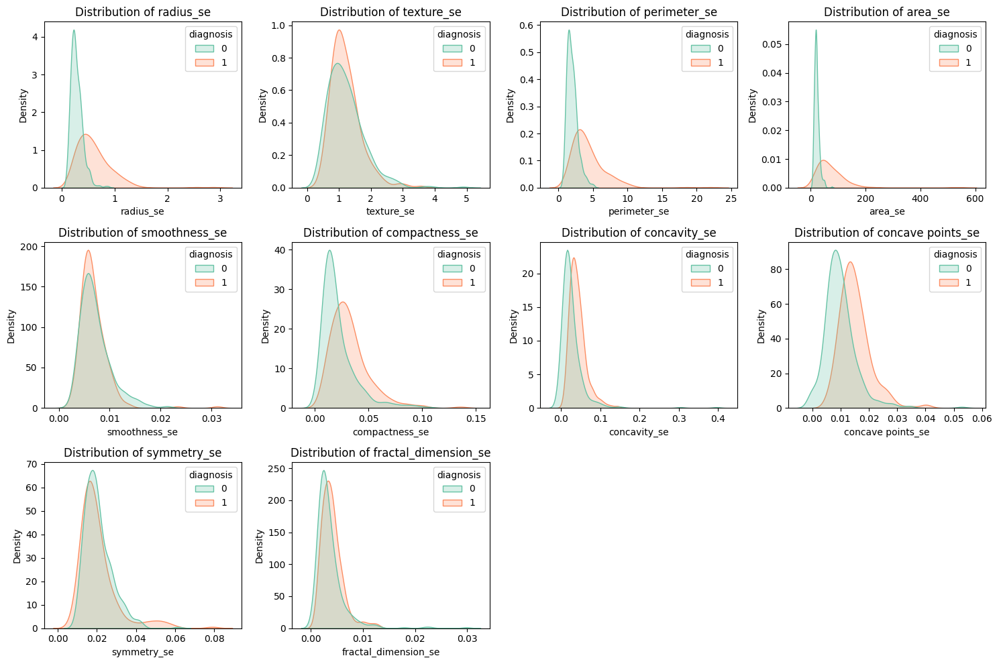

In [ ]:
# Comparing feature distributions between malignant and benign diagnoses
plt.figure(figsize=(15, 10))
for i, column in enumerate(df_CS.columns[11:21], 1):
    plt.subplot(3, 4, i)
    sns.kdeplot(data=df_CS, x=column, hue='diagnosis', fill=True, common_norm=False, palette='Set2')
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

COmme pour les marqueurs "mean", on constate que les variables texture_se,smoothness_se, symmetry_se et fractal_dimension_se ne permette pas de distinguer les cas bénins des cas malins

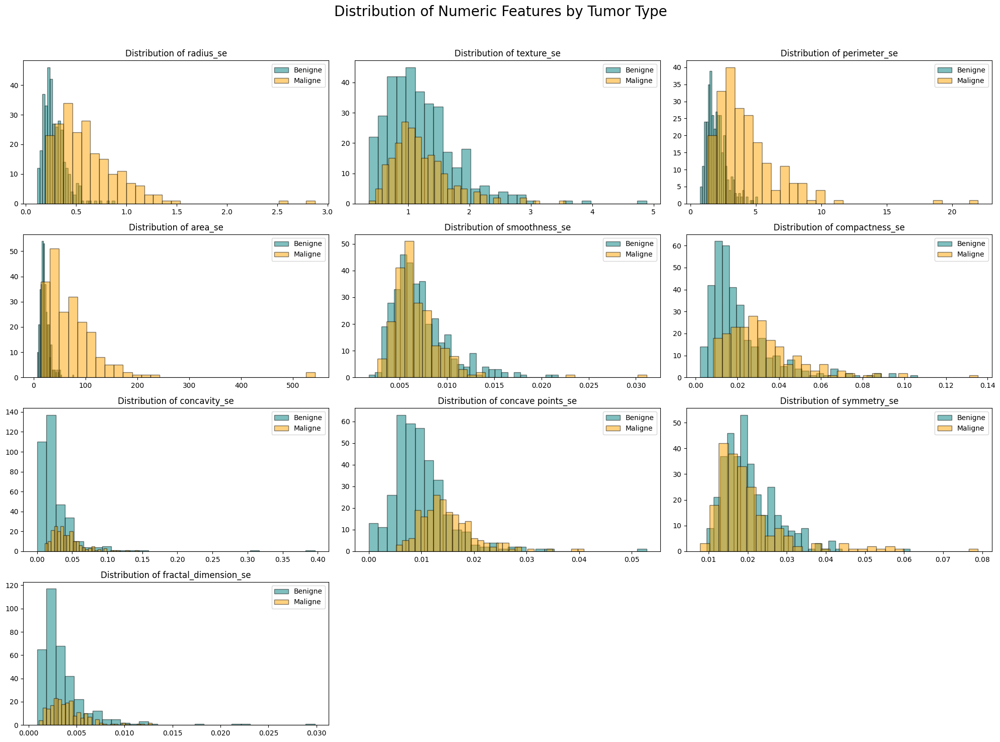

In [ ]:
# Filtrer les données par type de tumeur
benign = df_SE[df_SE['diagnosis'] == 0]
malignant = df_SE[df_SE['diagnosis'] == 1]

# Pour chaque colonne numérique dans df_mean
sans_col = ["diagnosis"]
df_SE_sans = df_SE.loc[:, ~df_SE.columns.isin(sans_col)]
numeric_columns = df_SE_sans.select_dtypes(include='number').columns

# Créer des histogrammes empilés
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns) // 3 + 1, 3, i)
    plt.hist(benign[column], bins=30, alpha=0.5, label='Benigne', color='teal', edgecolor='black')
    plt.hist(malignant[column], bins=30, alpha=0.5, label='Maligne', color='orange', edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.legend()

plt.suptitle('Distribution of Numeric Features by Tumor Type', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Si on s'en tient aux graphes de distribution, les variables radius, perimeter et area seraient celles qui offriraient une meilleure distinction entre cas bénins et cas malins sans pour autant que l'on puisse dédider définitivement

<ipython-input-74-798e489506b5>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SE[numeric_columns] = scaler.fit_transform(df_SE[numeric_columns])
<ipython-input-74-798e489506b5>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SE['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


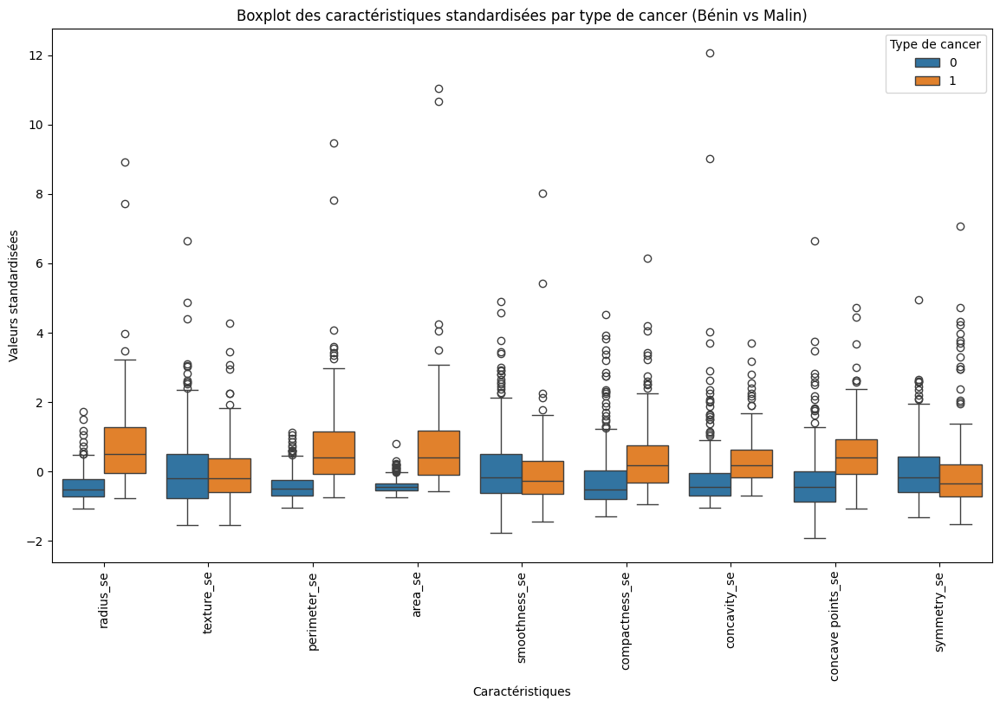

In [ ]:
from sklearn.preprocessing import StandardScaler

numeric_columns = df_SE.columns[1:-1]


# Standardisation des données
scaler = StandardScaler()
df_SE[numeric_columns] = scaler.fit_transform(df_SE[numeric_columns])

df_SE['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_SE.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

<ipython-input-75-3c3d78225f77>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SE[numeric_columns] = scaler.fit_transform(df_SE[numeric_columns])
<ipython-input-75-3c3d78225f77>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SE['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


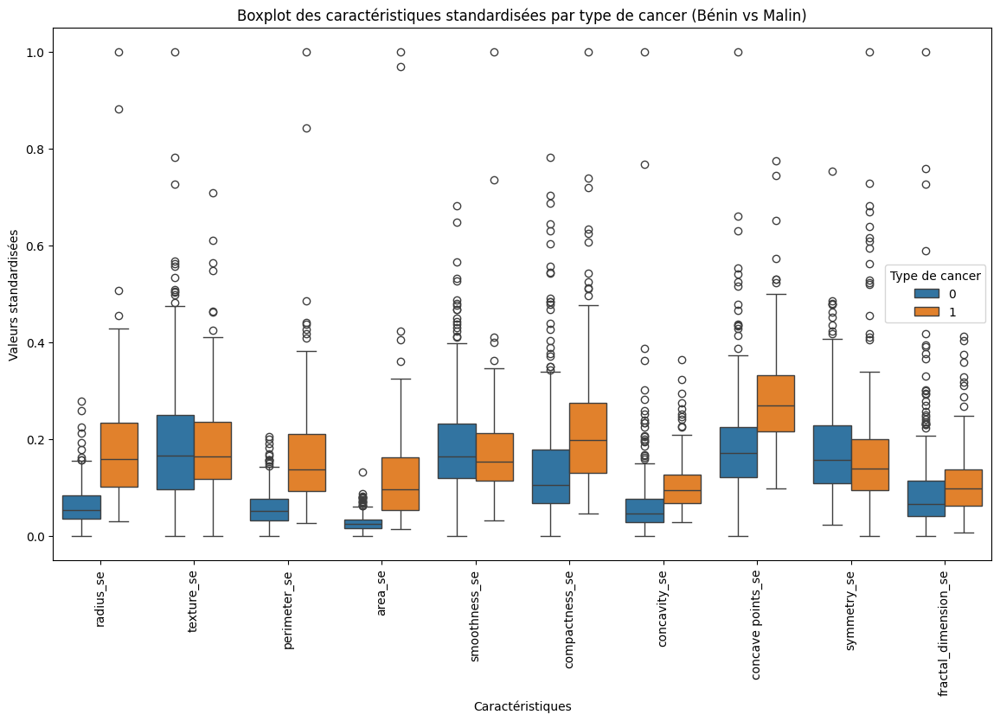

In [ ]:
from sklearn.preprocessing import MinMaxScaler

numeric_columns = df_SE.columns[1:-1]


# Standardisation des données
scaler = MinMaxScaler()
df_SE[numeric_columns] = scaler.fit_transform(df_SE[numeric_columns])

df_SE['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_SE.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

Nos observations sur les graphes de distribution sont confirmées par les boxplots pour les marqueurs texture_se, smoothness_se, symmetry_se, fractal_dimension_se

#Marqueurs "worst"

In [ ]:
df_worst = df_CS[['diagnosis', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']]

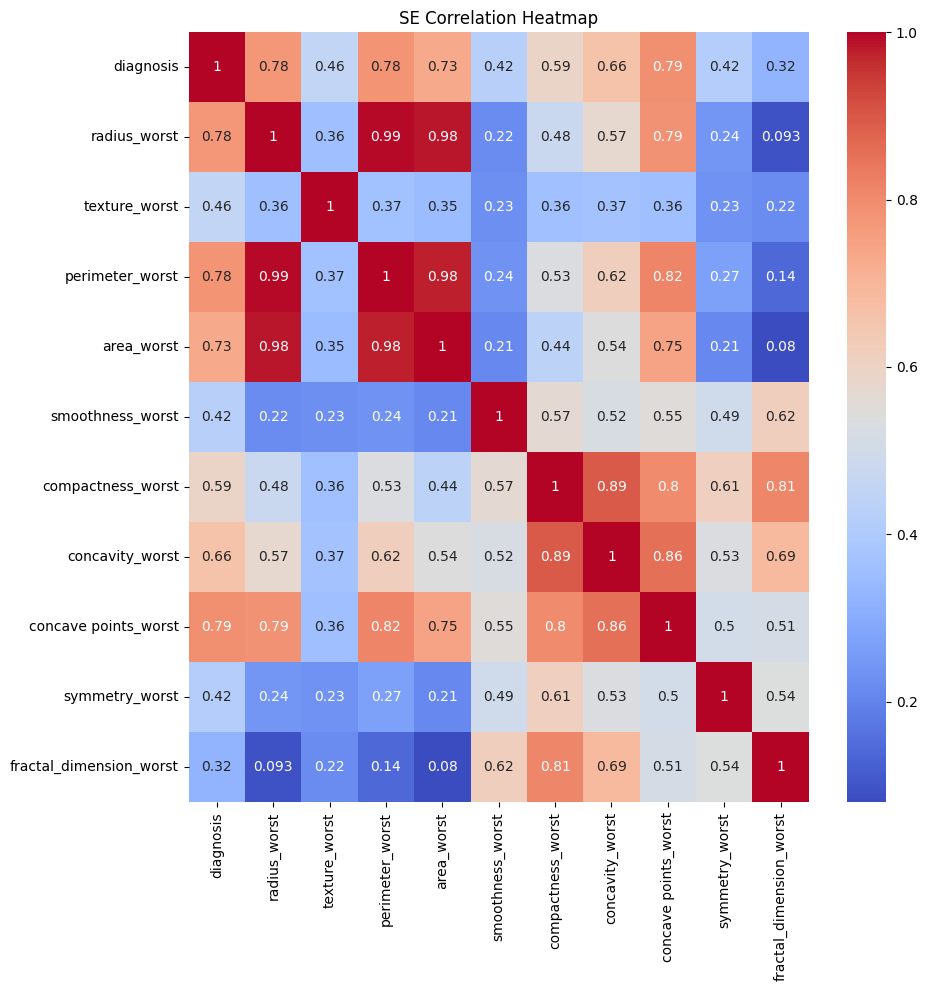

In [ ]:
correlation_matrix = df_worst.corr()

plt.figure(figsize = (10,10))

sns.heatmap(correlation_matrix, cmap="coolwarm", annot = True)

plt.title("SE Correlation Heatmap")

plt.show()

Les marqueurs radius, perimeter, area et compactness, concavity, concave points sont là aussi, comme pour les marqueurs "mean", fortement corrélés au diagnostic et ici aussi on remarque une forte corrélation entre radius-perimeter-area et compactness-concavity-concave points

Comme vu précédemment, radius-perimeter-area sont calculées les unes par rapport aux autres, on n'en gardera qu'une

Pour ce qui est de compactness, concavity, concave points, si elles ne sont pas calculées les unes par rapport aux autres, compactness est calculée par rapport a perimeter et à area

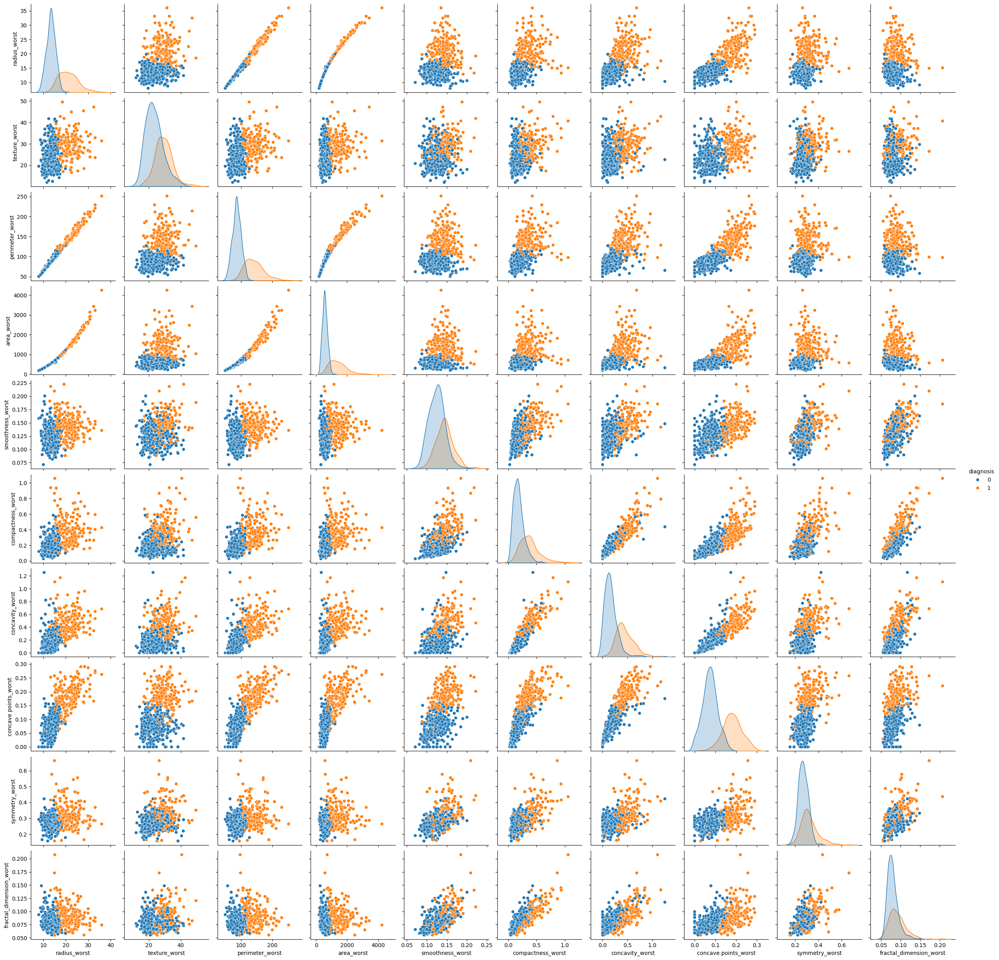

In [ ]:
sns.pairplot(df_worst, hue="diagnosis")
plt.show()

On observe ici encore une absence de tendance pour les variables texture, smoothness, symmetry et fractal_dimension

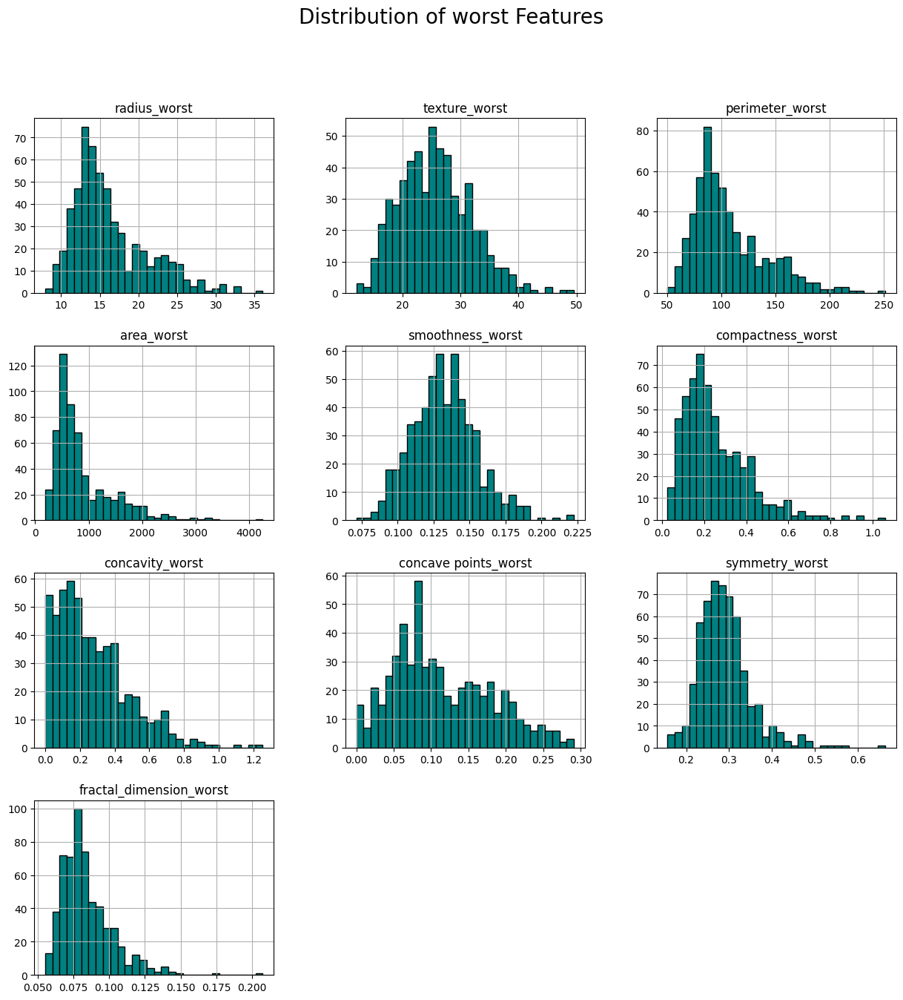

In [ ]:
# Examine the distributions of worst features
sans_col = ["diagnosis"]
df_worst_sans = df_worst.loc[:, ~df_worst.columns.isin(sans_col)]

df_worst_sans.hist(bins=30, figsize=(15, 15), color='teal', edgecolor='black')
plt.suptitle('Distribution of worst Features', fontsize=20)
plt.show()

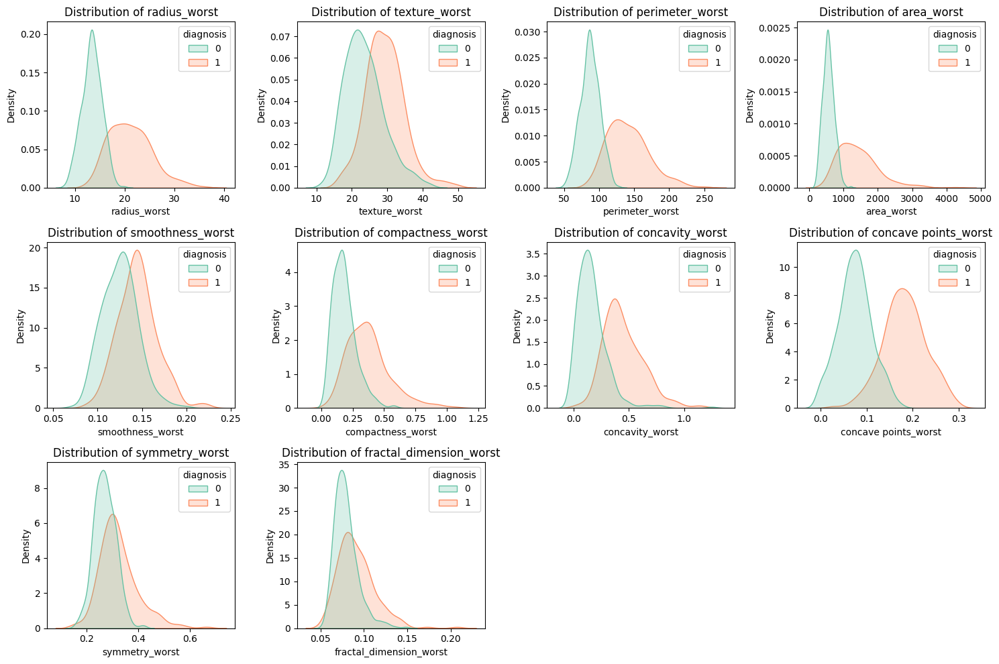

In [ ]:
# Comparing feature distributions between malignant and benign diagnoses
plt.figure(figsize=(15, 10))
for i, column in enumerate(df_CS.columns[21:31], 1):
    plt.subplot(3, 4, i)
    sns.kdeplot(data=df_CS, x=column, hue='diagnosis', fill=True, common_norm=False, palette='Set2')
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

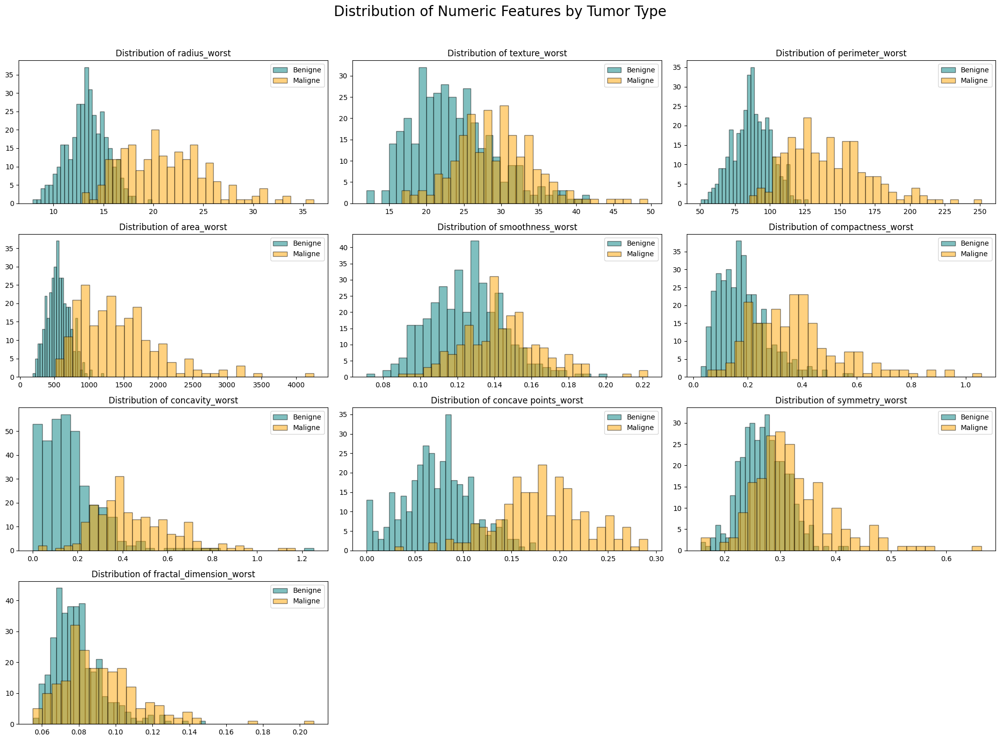

In [ ]:
# Filtrer les données par type de tumeur
benign = df_worst[df_worst['diagnosis'] == 0]
malignant = df_worst[df_worst['diagnosis'] == 1]

# Pour chaque colonne numérique dans df_mean
sans_col = ["diagnosis"]
df_worst_sans = df_worst.loc[:, ~df_worst.columns.isin(sans_col)]
numeric_columns = df_worst_sans.select_dtypes(include='number').columns

# Créer des histogrammes empilés
plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns) // 3 + 1, 3, i)
    plt.hist(benign[column], bins=30, alpha=0.5, label='Benigne', color='teal', edgecolor='black')
    plt.hist(malignant[column], bins=30, alpha=0.5, label='Maligne', color='orange', edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.legend()

plt.suptitle('Distribution of Numeric Features by Tumor Type', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Les graphes de distribution confirment nos analyses précédentes

<ipython-input-82-a76a09dc995f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_worst[numeric_columns] = scaler.fit_transform(df_worst[numeric_columns])
<ipython-input-82-a76a09dc995f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_worst['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


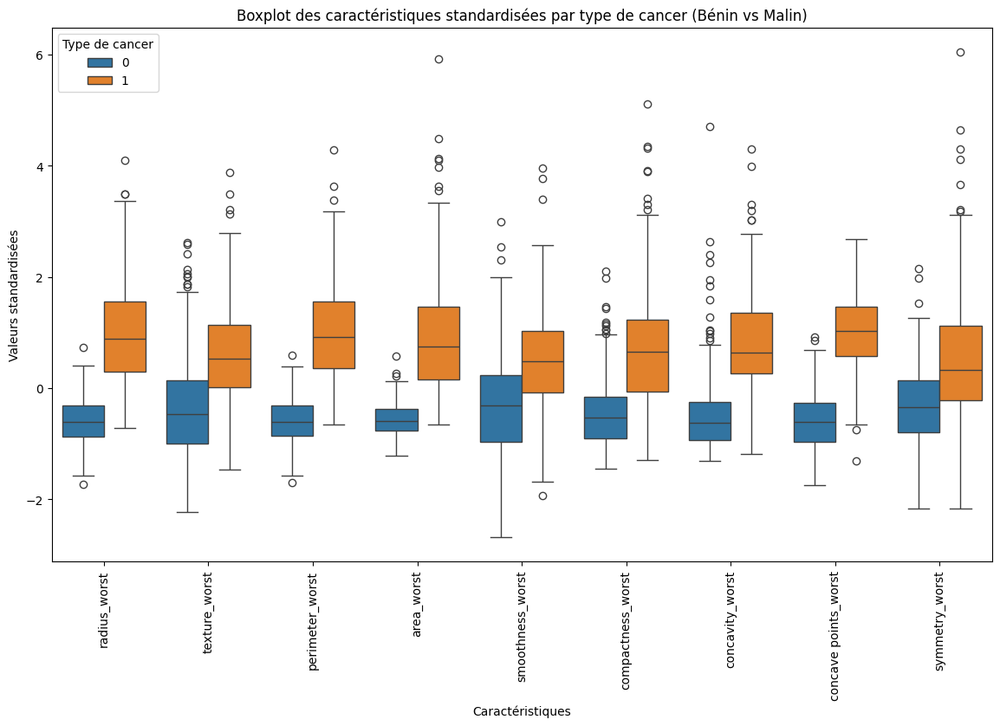

In [ ]:
from sklearn.preprocessing import StandardScaler

numeric_columns = df_worst.columns[1:-1]


# Standardisation des données
scaler = StandardScaler()
df_worst[numeric_columns] = scaler.fit_transform(df_worst[numeric_columns])

df_worst['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_worst.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

<ipython-input-83-a0927116662c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_worst[numeric_columns] = scaler.fit_transform(df_worst[numeric_columns])
<ipython-input-83-a0927116662c>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_worst['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})


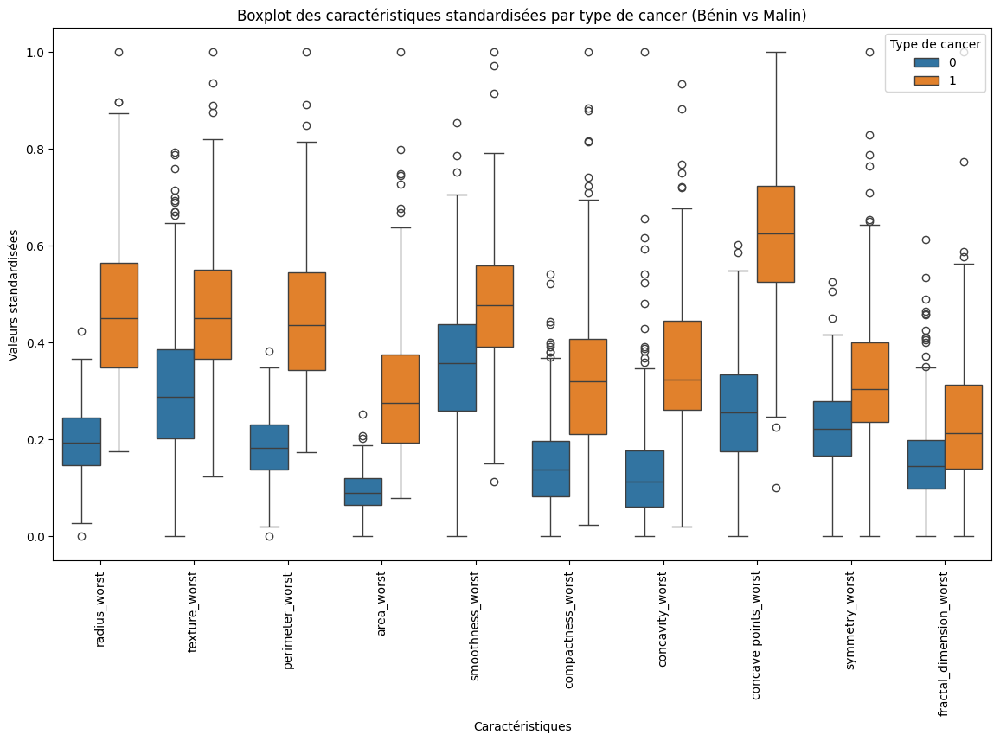

In [ ]:
from sklearn.preprocessing import MinMaxScaler

numeric_columns = df_worst.columns[1:-1]


# Standardisation des données
scaler = MinMaxScaler()
df_worst[numeric_columns] = scaler.fit_transform(df_worst[numeric_columns])

df_worst['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_worst.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

Les boxplots ne reflètent que légèrement les constatations que nous avons pu faire sur les marqueurs "worst" jusqu'à présent

#Analyse par marqueur

##marqueurs area

In [ ]:
df_area = df_CS[['area_mean', 'area_se', 'area_worst']]

<ipython-input-64-0bdf84355c22>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_area["diagnosis"] = df_CS["diagnosis"]


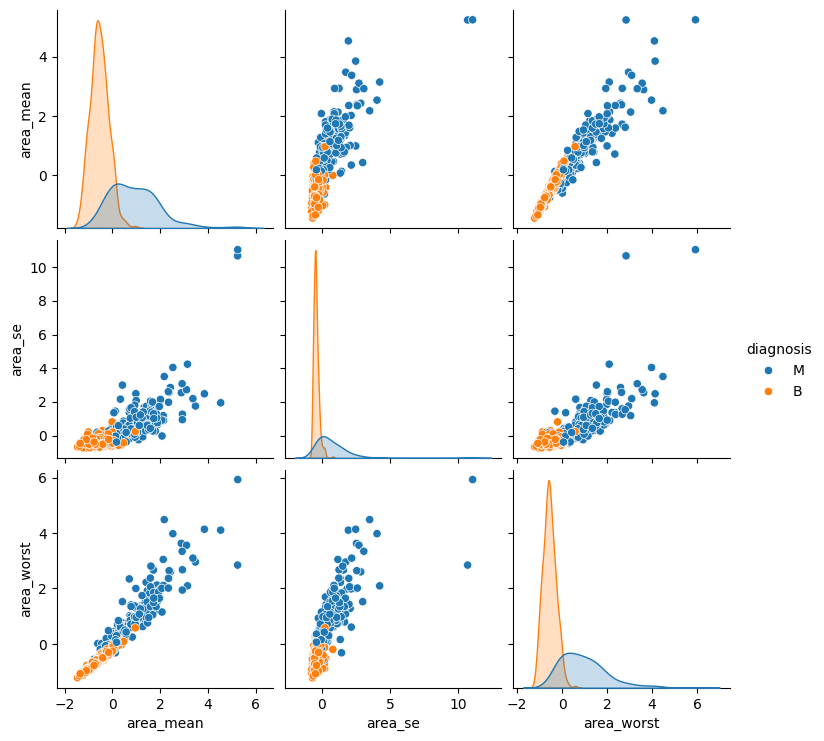

In [ ]:
df_area["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_area, hue="diagnosis")
plt.show()

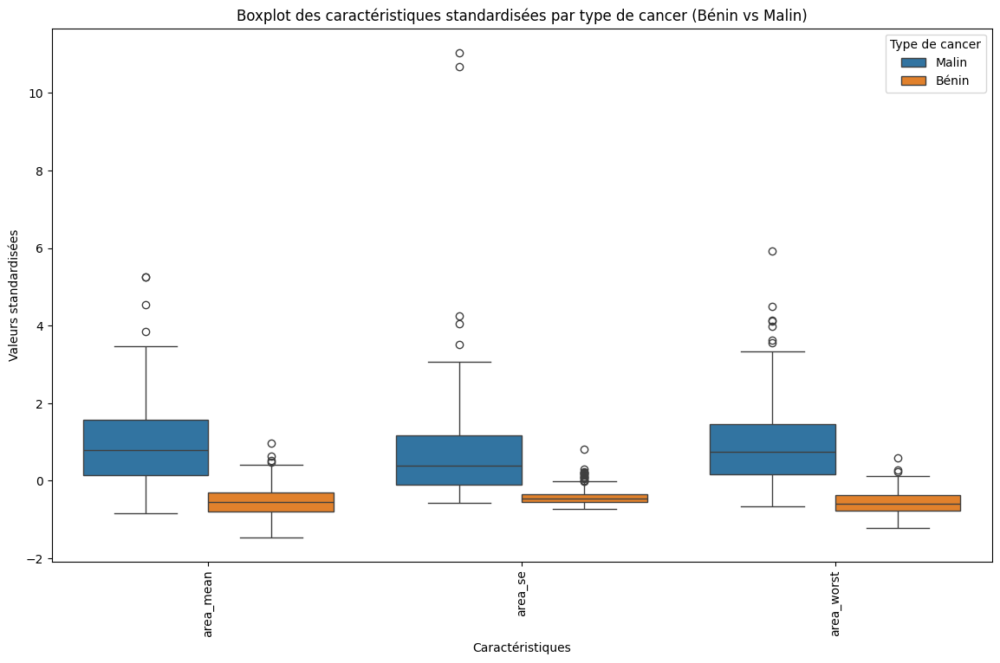

In [ ]:
from sklearn.preprocessing import StandardScaler

df_area = df_area.drop("diagnosis", axis = 1)
numeric_columns = df_area.columns


# Standardisation des données
scaler = StandardScaler()
df_area[numeric_columns] = scaler.fit_transform(df_area[numeric_columns])

df_area['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_area.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueurs perimetre

In [ ]:
df_perimeter = df_CS[['perimeter_mean', 'perimeter_se', 'perimeter_worst']]

<ipython-input-69-feb60d4be78a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_perimeter["diagnosis"] = df_CS["diagnosis"]


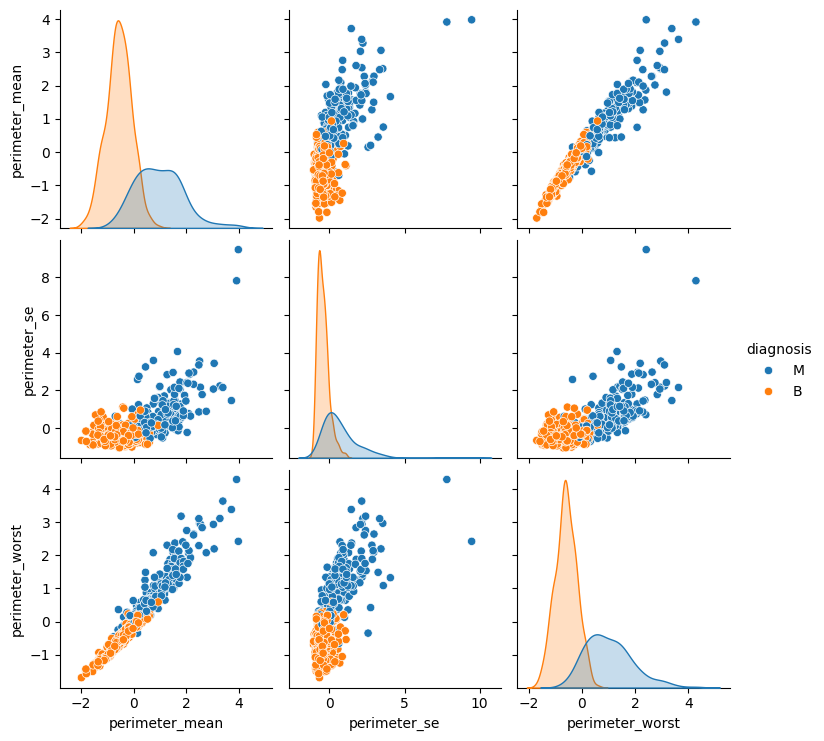

In [ ]:
df_perimeter["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_perimeter, hue="diagnosis")
plt.show()

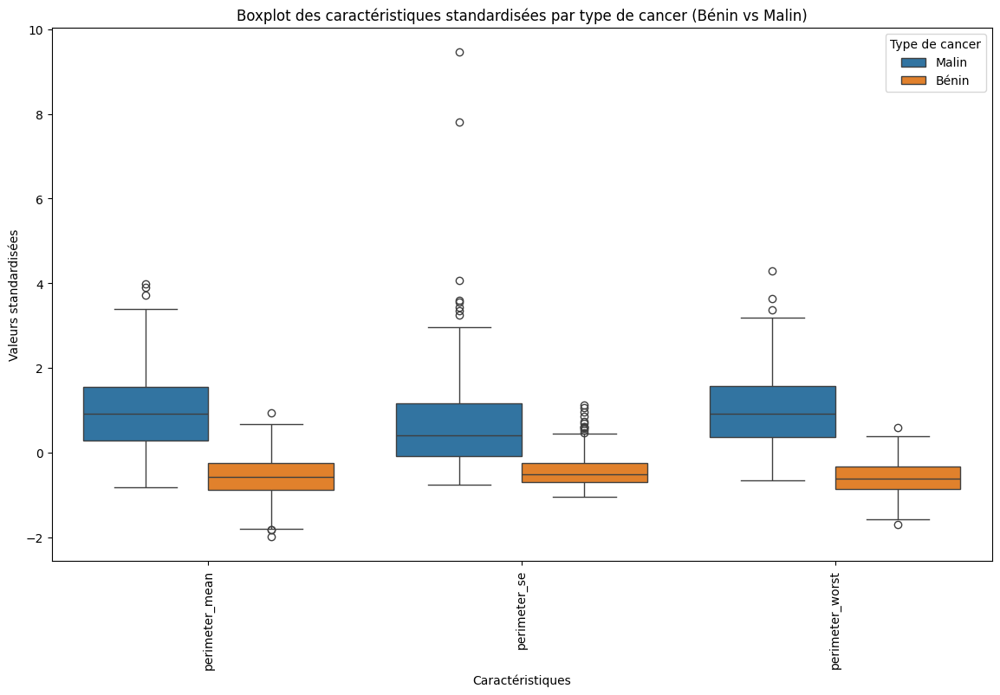

In [ ]:
from sklearn.preprocessing import StandardScaler

df_perimeter = df_perimeter.drop("diagnosis", axis = 1)
numeric_columns = df_perimeter.columns

# Standardisation des données
scaler = StandardScaler()
df_perimeter[numeric_columns] = scaler.fit_transform(df_perimeter[numeric_columns])

df_perimeter['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_perimeter.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur texture

In [ ]:
df_texture = df_CS[['texture_mean', 'texture_se', 'texture_worst']]

<ipython-input-73-7acd246c40ce>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_texture["diagnosis"] = df_CS["diagnosis"]


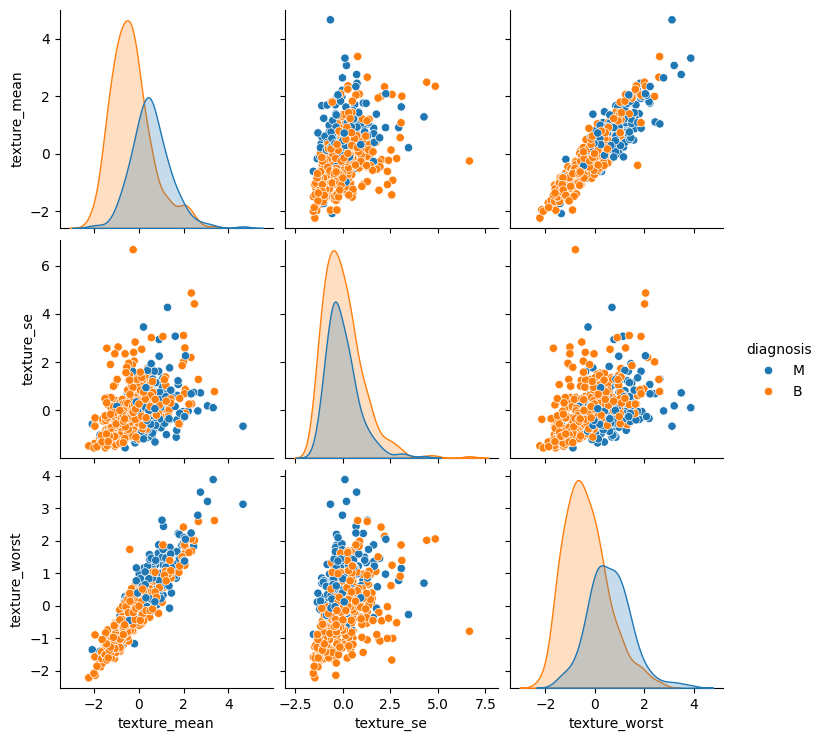

In [ ]:
df_texture["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_texture, hue="diagnosis")
plt.show()

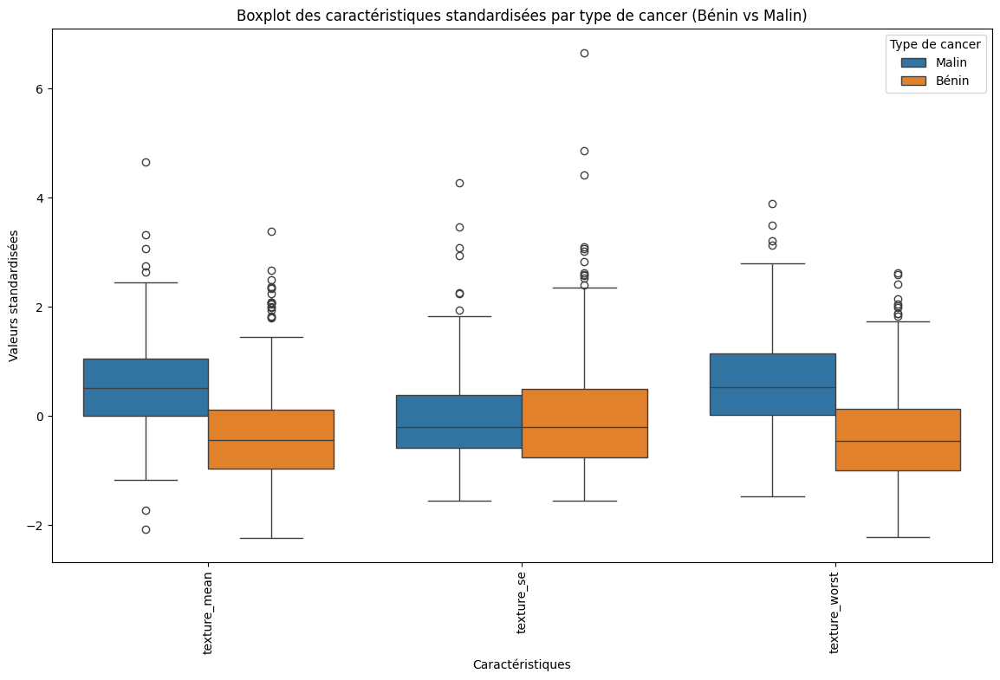

In [ ]:
from sklearn.preprocessing import StandardScaler

df_texture = df_texture.drop("diagnosis", axis = 1)
numeric_columns = df_texture.columns


# Standardisation des données
scaler = StandardScaler()
df_texture[numeric_columns] = scaler.fit_transform(df_texture[numeric_columns])

df_texture['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_texture.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur smoothness

In [ ]:
df_smoothness = df_CS[['smoothness_mean', 'smoothness_se', 'smoothness_worst']]

<ipython-input-76-8b3af7ad13bb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_smoothness["diagnosis"] = df_CS["diagnosis"]


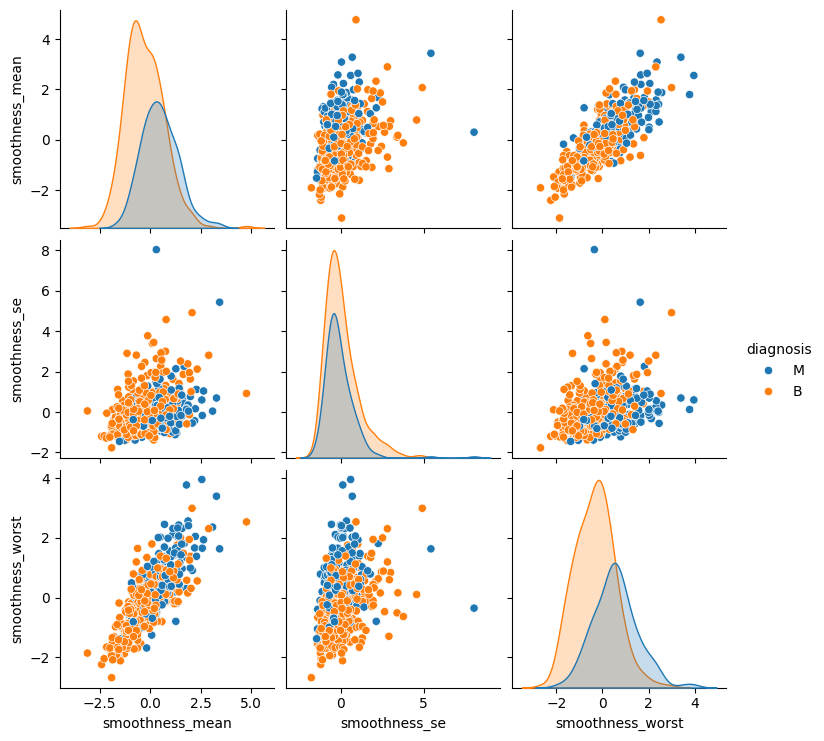

In [ ]:
df_smoothness["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_smoothness, hue="diagnosis")
plt.show()

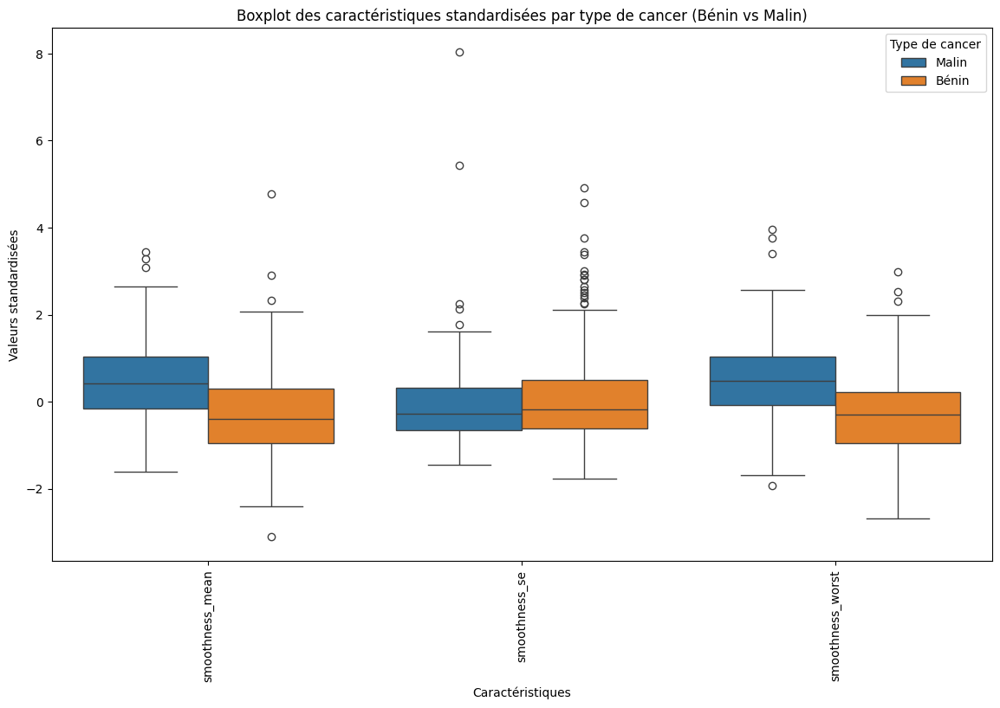

In [ ]:
from sklearn.preprocessing import StandardScaler

df_smoothness = df_smoothness.drop("diagnosis", axis = 1)
numeric_columns = df_smoothness.columns


# Standardisation des données
scaler = StandardScaler()
df_smoothness[numeric_columns] = scaler.fit_transform(df_smoothness[numeric_columns])

df_smoothness['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_smoothness.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur compactness

In [ ]:
df_compactness = df_CS[['compactness_mean', 'compactness_se', 'compactness_worst']]

<ipython-input-79-7cbb91714f9a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_compactness["diagnosis"] = df_CS["diagnosis"]


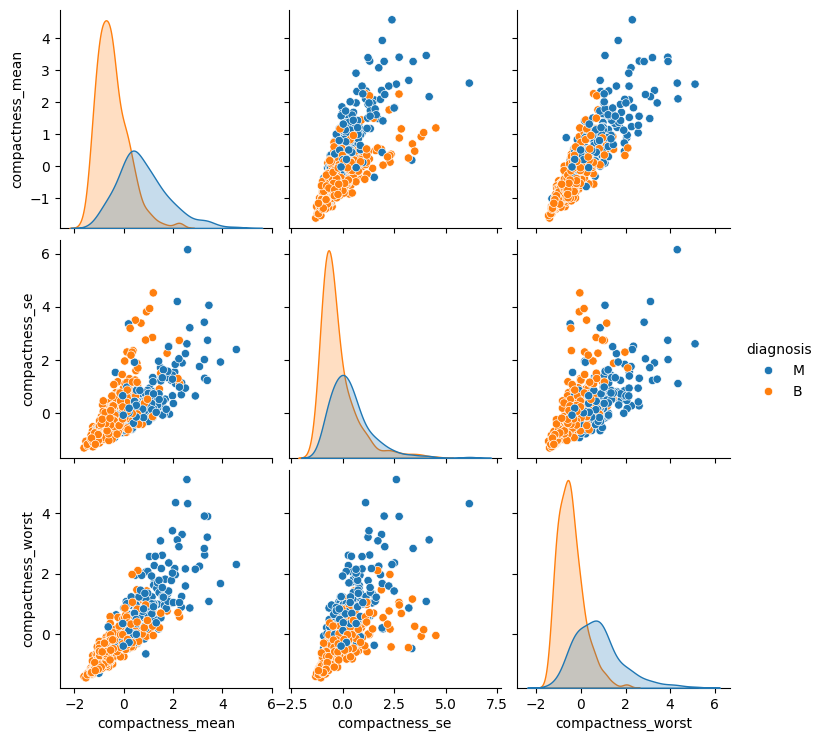

In [ ]:
df_compactness["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_compactness, hue="diagnosis")
plt.show()

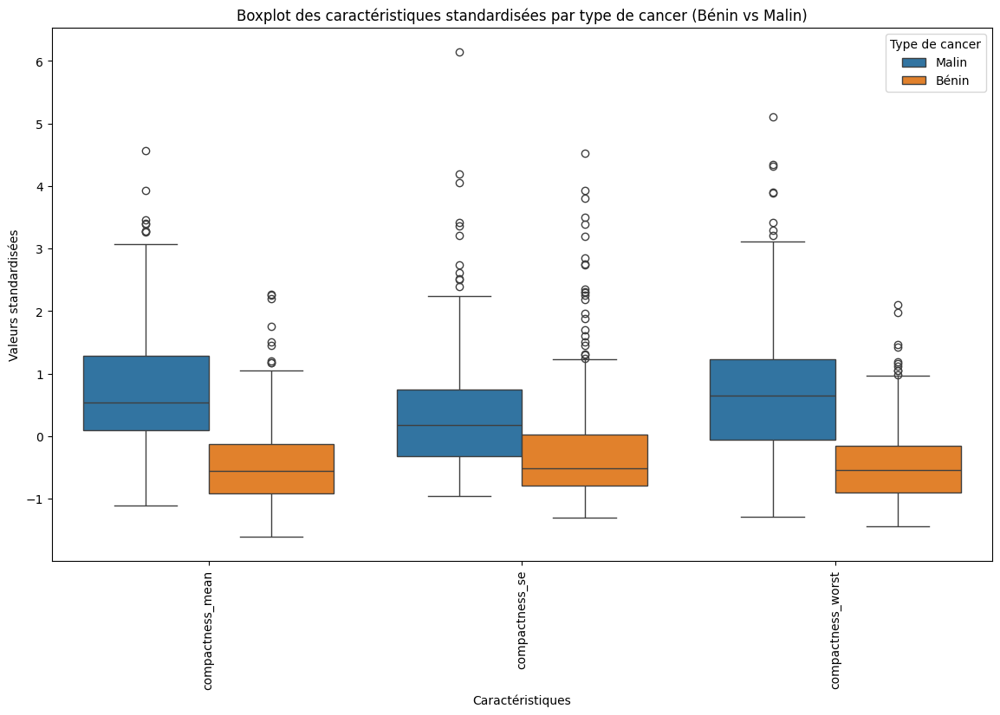

In [ ]:
from sklearn.preprocessing import StandardScaler

df_compactness = df_compactness.drop("diagnosis", axis = 1)
numeric_columns = df_compactness.columns


# Standardisation des données
scaler = StandardScaler()
df_compactness[numeric_columns] = scaler.fit_transform(df_compactness[numeric_columns])

df_compactness['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_compactness.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur concavity

In [ ]:
df_concavity = df_CS[['concavity_mean', 'concavity_se', 'concavity_worst']]

<ipython-input-82-64545a66d651>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_concavity["diagnosis"] = df_CS["diagnosis"]


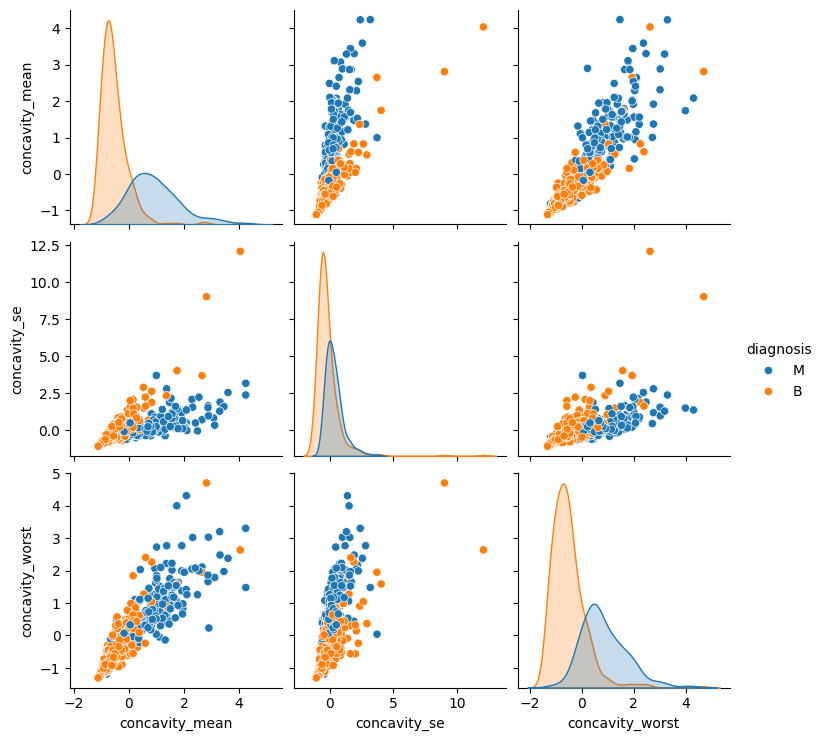

In [ ]:
df_concavity["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_concavity, hue="diagnosis")
plt.show()

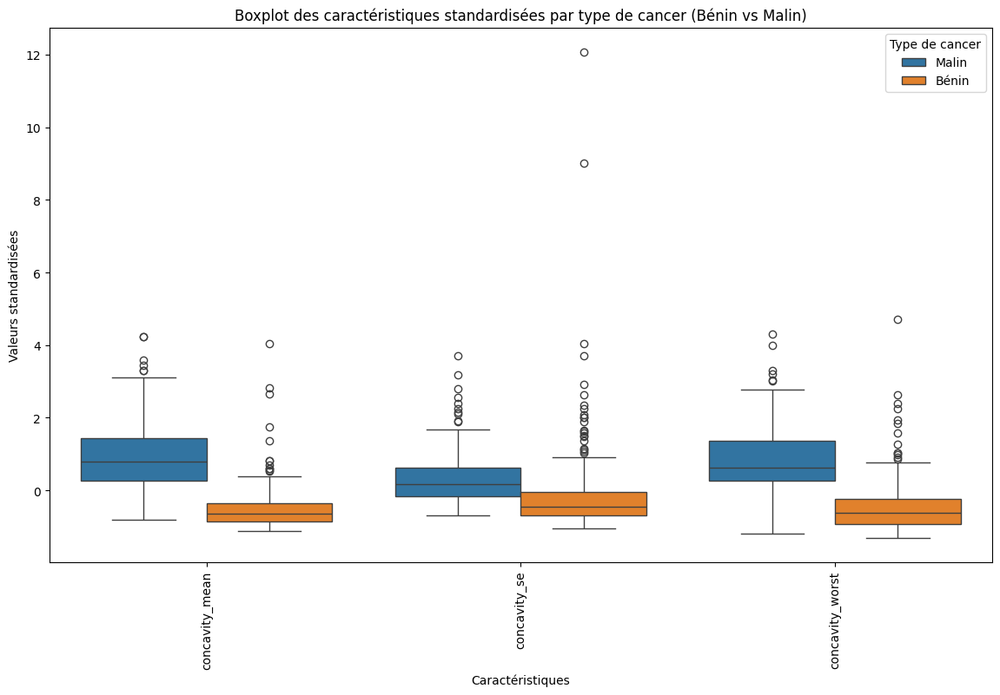

In [ ]:
from sklearn.preprocessing import StandardScaler

df_concavity = df_concavity.drop("diagnosis", axis = 1)
numeric_columns = df_concavity.columns


# Standardisation des données
scaler = StandardScaler()
df_concavity[numeric_columns] = scaler.fit_transform(df_concavity[numeric_columns])

df_concavity['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_concavity.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur concavity points

In [ ]:
df_cp = df_CS[['concave points_mean', 'concave points_se', 'concave points_worst']]

<ipython-input-85-dc053e92ff36>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cp["diagnosis"] = df_CS["diagnosis"]


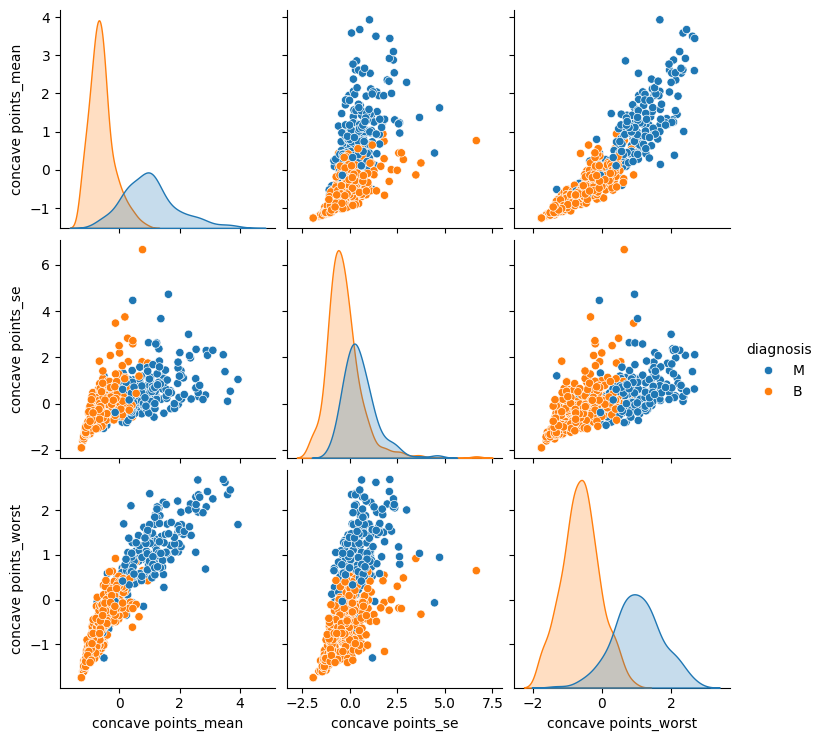

In [ ]:
df_cp["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_cp, hue="diagnosis")
plt.show()

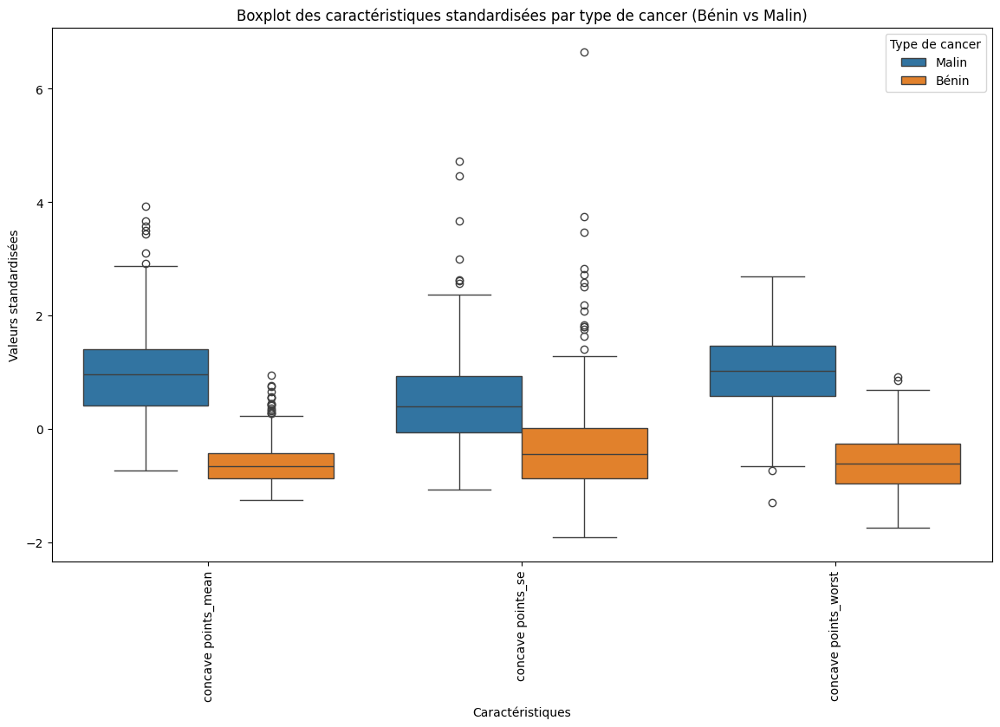

In [ ]:
from sklearn.preprocessing import StandardScaler

df_cp = df_cp.drop("diagnosis", axis = 1)
numeric_columns = df_cp.columns


# Standardisation des données
scaler = StandardScaler()
df_cp[numeric_columns] = scaler.fit_transform(df_cp[numeric_columns])

df_cp['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_cp.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur symmetry

In [ ]:
df_symmetry = df_CS[['symmetry_mean', 'symmetry_se', 'symmetry_worst']]

<ipython-input-88-3121a05eca4e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_symmetry["diagnosis"] = df_CS["diagnosis"]


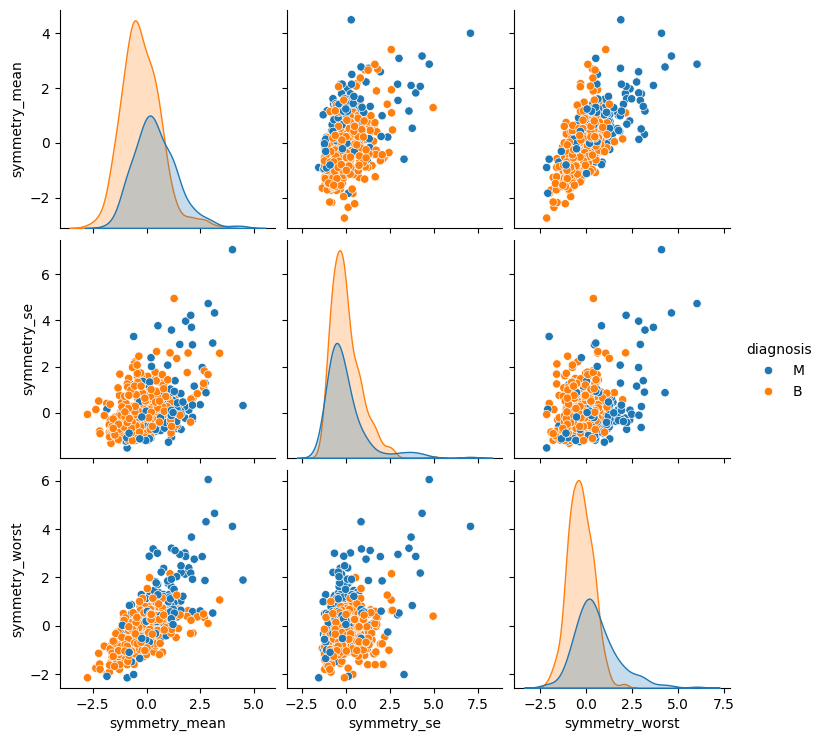

In [ ]:
df_symmetry["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_symmetry, hue="diagnosis")
plt.show()

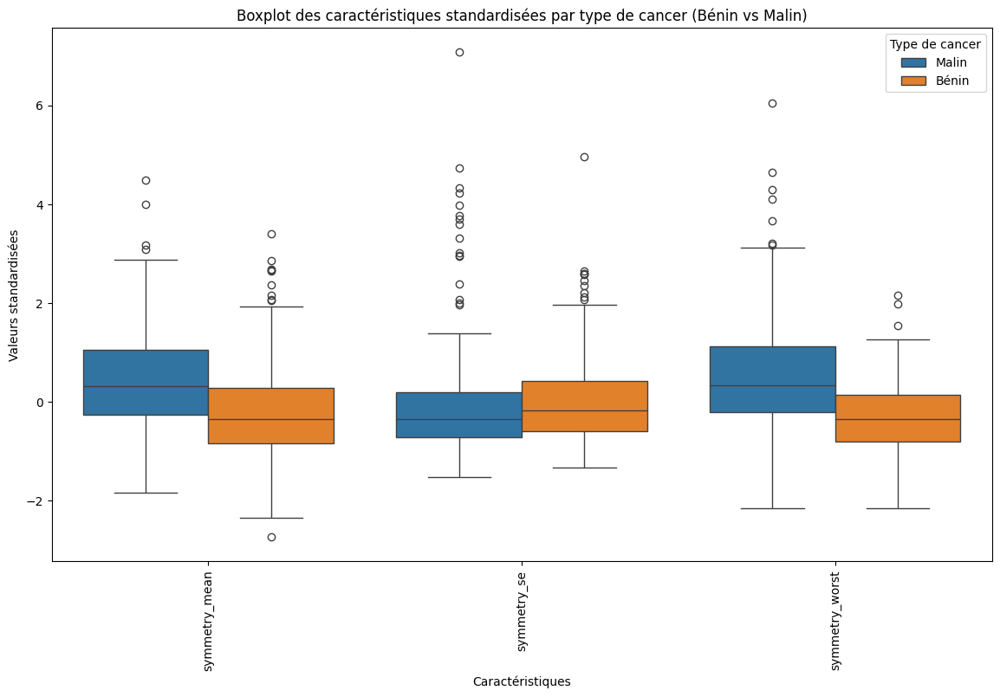

In [ ]:
from sklearn.preprocessing import StandardScaler

df_symmetry = df_symmetry.drop("diagnosis", axis = 1)
numeric_columns = df_symmetry.columns


# Standardisation des données
scaler = StandardScaler()
df_symmetry[numeric_columns] = scaler.fit_transform(df_symmetry[numeric_columns])

df_symmetry['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_symmetry.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

##marqueur fractal dimension

In [ ]:
df_fd = df_CS[['fractal_dimension_mean', 'fractal_dimension_se', 'fractal_dimension_worst' ]]

<ipython-input-91-831afc7b6ce9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fd["diagnosis"] = df_CS["diagnosis"]


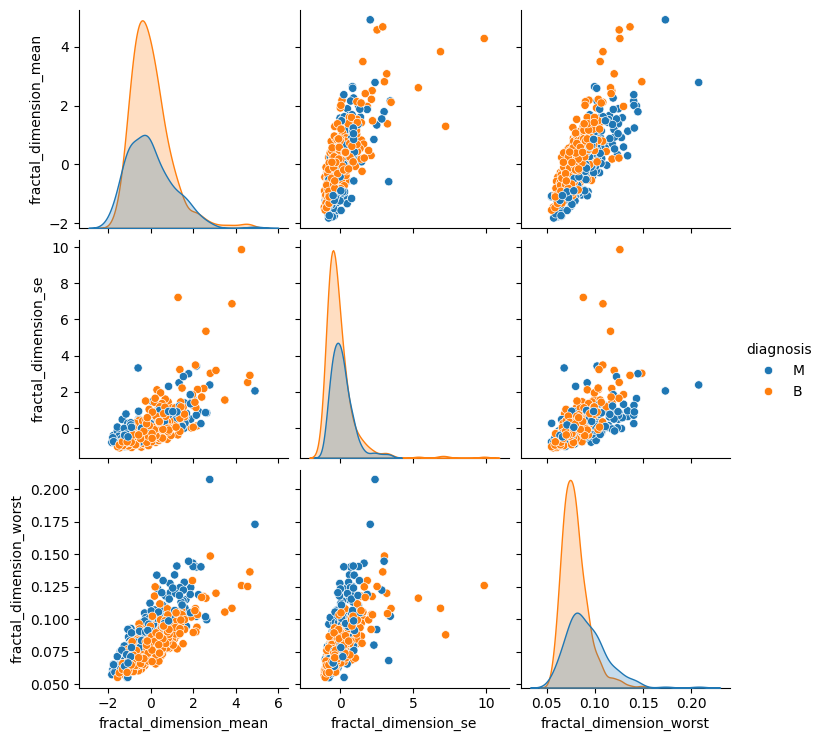

In [ ]:
df_fd["diagnosis"] = df_CS["diagnosis"]

sns.pairplot(df_fd, hue="diagnosis")
plt.show()

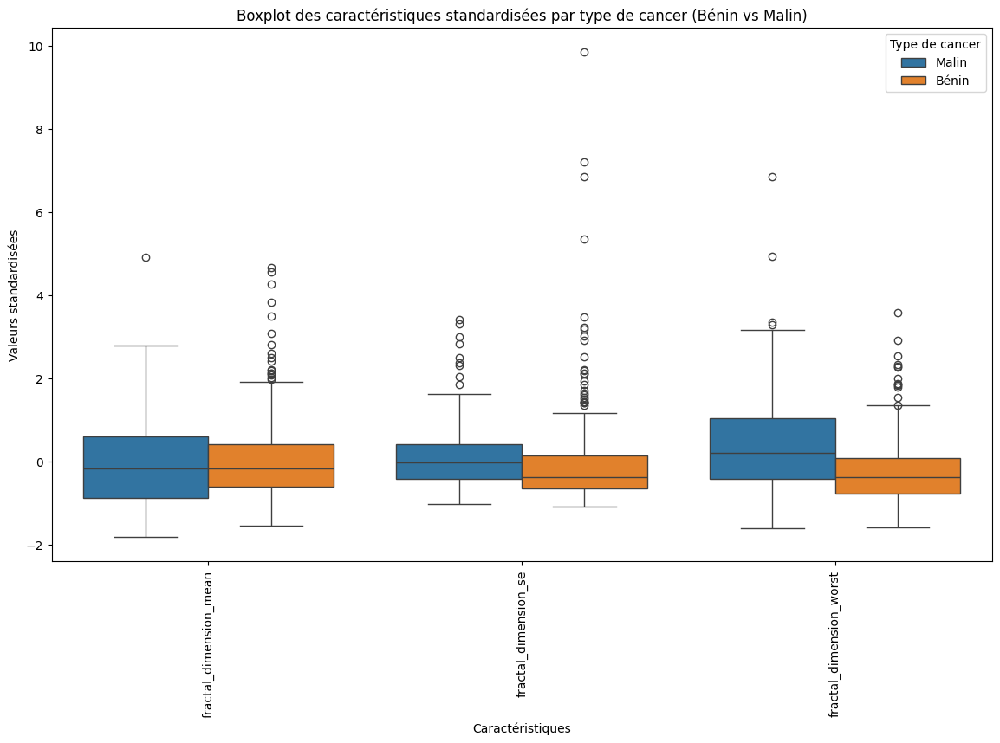

In [ ]:
from sklearn.preprocessing import StandardScaler

df_fd = df_fd.drop("diagnosis", axis = 1)
numeric_columns = df_fd.columns


# Standardisation des données
scaler = StandardScaler()
df_fd[numeric_columns] = scaler.fit_transform(df_fd[numeric_columns])

df_fd['Type'] = df_CS['diagnosis'].replace({"B": 'Bénin', "M": 'Malin'})

# Convertir les données en format long (long format) pour seaborn
melted_data = df_fd.melt(id_vars=['Type'], value_vars=numeric_columns, var_name='Caractéristique', value_name='Valeur standardisée')

# Création des boxplots pour les caractéristiques standardisées, séparées par groupe
plt.figure(figsize=(14, 8))
sns.boxplot(x='Caractéristique', y='Valeur standardisée', hue='Type', data=melted_data)
plt.xticks(rotation=90)
plt.title('Boxplot des caractéristiques standardisées par type de cancer (Bénin vs Malin)')
plt.xlabel('Caractéristiques')
plt.ylabel('Valeurs standardisées')
plt.legend(title='Type de cancer')
plt.show()

#Commentaires

Après un pré nettoyage du dataset et quelques visualisations, on peut d'hors et déjà faire quelques remarques:

1. Le dataset est plutôt "propre". Il ne comporte ni valeurs manquantes ni doublons.

  Néanmoins on détecte la présence de nombreux outliers. Se posera la question de leur traitement

  Dans le domaine médical un outlier n'est pas nécessairement le signe d'une erreur mais en fonction du contexte (ici de la pathologie) peut avoir une vraie signification. Il faut donc avoir une bonne compréhension métier pour en faire une gestion otpimale



2. Les différentes visualisations montrent de fortes corrélations positives  pour certaines caractéristiques

  En revanche il n'existe pas toujours de distinction claire entre cas bénins et malins

  On axera donc notre analyse sur les caractéristiques les plus corrélées c'est à dire les valeurs probablement les plus significatives.
  
  L'analyse statistique devrait nous permettre de les identifier

  A l'inverse, les variables qui ne semblent pas pertinentes dans l'établissement du diagnostic seront mises de côté

3. D'après nos visualisations nous pouvons exclure de l'analyse les variables texture_mean, texture_se, texture_worst, smoothness_mean, smoothness_se, smoothness_worst, symmetry_mean, symmetry_se, symmetry_worst, fractal_dimension_mean, fractal_dimension_se et fractal_dimension_worst soit 12 marqueurs

Les analyses statistiques devraient nous permettre de réduire les variables restantes afin de ne conserver que les variables statistiquement significatives

4. Il nous reste également à vérifier que les données sont cohérentes avec les mesures relevées dans le document de veille

La difficulté à déterminer des seuils nous obligent à être très attentifs aux traitements que nous allons opérer sur les données (notamment normalisation / standardisation)

5. A ce stade, ni le nettoyage des données ni leur analyse ne sont terminés

  Il reste à déterminer les variables les plus impactantes dans l'analyse et à définir la stratégie à adopter pour les outliers

  La question du rééquilibrage du dataset se posera lors du choix du modèle de prédiction

  Et pour l'encodage des données nous devrons choisir le scaler le moins sensible aux outliers

In [ ]:
df_prepa = df_CduS[["diagnosis", "radius_mean", "radius_se", "radius_worst",
                    "perimeter_mean", "perimeter_se", "perimeter_worst",
                    "area_mean", "area_se", "area_worst",
                    "compactness_mean", "compactness_se", "compactness_worst",
                    "concavity_mean", "concavity_se", "concavity_worst",
                    "concave points_mean", "concave points_se", "concave points_worst"]]

# soit 18 marqueurs hors diagnostic

Comme vu précédemment les variables perimeter et area sont calculées à partir de radius et permettent de calculer compactness

Nous devrons probablement les exclure elles aussi de l'analyse, ce qui nous donnerait le dataset suivant

In [ ]:
df_almost = df_CduS[["diagnosis", "radius_mean", "radius_se", "radius_worst",
                    "compactness_mean", "compactness_se", "compactness_worst",
                    "concavity_mean", "concavity_se", "concavity_worst",
                    "concave points_mean", "concave points_se", "concave points_worst"]]

# soit 12 marqueurs hors diagnostic

##Seuils attendus pour chaque marqueur

###Radius (rayon)

Représente la distance du centre au périmètre de la cellule.
Seuil attendu : Typiquement entre 6 et 30 unités (selon l'échelle utilisée).

###Texture

Variation locale des intensités des pixels.
Seuil attendu : Varie généralement de 10 à 40 unités.

###Perimeter (périmètre)

Longueur du contour de la cellule.
Seuil attendu : Typiquement entre 50 et 200 unités.

###Area (aire)

Surface de la cellule.
Seuil attendu : Généralement entre 150 et 2500 unités.

###Smoothness (lissage)

Variation locale des longueurs des rayons du périmètre.
Seuil attendu : Varie souvent entre 0.05 et 0.2 unités.

###Compactness (compacité)

Périmètre^2 / aire - 1.0.
Seuil attendu : Typiquement entre 0.02 et 0.5 unités.

###Concavity (concavité)

Gravité des parties concaves du contour.
Seuil attendu : Généralement entre 0 et 0.5 unités.

###Concave points (points concaves)

Nombre de points concaves pour les contours.
Seuil attendu : Varie souvent entre 0 et 0.2 unités.

###Symmetry (symétrie)

Symétrie.
Seuil attendu : Typiquement entre 0.1 et 0.3 unités.

###Fractal dimension (dimension fractale)

Estimation de la rugosité du contour.
Seuil attendu : Varie souvent entre 0.05 et 0.1 unités

###Si on se fie à ces premières informations concernant les seuils, on constate qu'il peut y avoir des variations très importantes pour certains marqueurs, à tel point qu'on ne peut plus vraiment parler de seuil